#Projet Analyse Factorielle MLSD


# Installation et importation des bibliothèques qui nous interessent

In [ ]:
!pip install transformers
!pip install rpy2
!pip install hdbscan
!pip install umap-learn
!pip install coclust
!pip install scikit-learn==0.22.2

In [ ]:
import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()
utils_r = importr('utils')
utils_r.install_packages('FCPS', repos="https://cloud.r-project.org")
utils_r.install_packages('clustrd', repos="https://cloud.r-project.org")

base = importr('base')
fcps = importr('FCPS')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib

from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors

from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans, SpectralClustering, AgglomerativeClustering
import hdbscan
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, normalized_mutual_info_score, adjusted_rand_score
from coclust.evaluation.external import accuracy

from sklearn.preprocessing import LabelEncoder 


from torch.utils.data import DataLoader

from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from scipy.optimize import linear_sum_assignment
from scipy.optimize import linear_sum_assignment
from tqdm import tqdm
from sklearn.metrics import davies_bouldin_score

import requests
import warnings
import torch
import re

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('stopwords')

# Importation du module "utils" contenant des fonctions necessaires au fonctionnement du code
# Fichier partagé par Mme Mira Ait Saada lors de la séance de tp
import sys
dir_path = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/"
sys.path.append(dir_path)

import importlib
import utils

from DKM_DCN_tf_py import DCN, DKM

if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

Metrique davies_bouldin : https://www.geeksforgeeks.org/dunn-index-and-db-index-cluster-validity-indices-set-1/


In [ ]:
def davies_bouldin_metric(list_X, list_pred_labels, list_titles):
  list_of_metric = []

  for i in range(len(list_X)):
    list_of_metric.append(davies_bouldin_score(list_X[i], list_pred_labels[i]))

  df = pd.DataFrame(columns=list_titles)
  df.loc[0] = list_of_metric
  
  return df


def affichage2D(list_X, list_pred_labels, list_titles):
  fig = plt.figure(figsize=(20,6))
  outer = gridspec.GridSpec(1, 4, wspace=0.1)

  n = len(list_X)

  for i in range(n):
    ax = plt.Subplot(fig, outer[i])
    ax.set_title(list_titles[i])
    ax.axis('off')
    
    for j in set(list_pred_labels[i]):
      ax.scatter( list_X[i][pred_labels==j, 0], list_X[i][pred_labels==j, 1], label=str(j))
    fig.add_subplot(ax)

  plt.show()

#<font color='red'> Analyse de la dataset ***Article_1*** </font>

## Importation des données

In [ ]:
chemin = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/data/nlp_dataset_Articles_1.csv"
dataset = pd.read_csv(chemin, sep=";", index_col=0)

texts = dataset['text']

print(dataset)

                                                   text
0     Eli Manning remains the New York Giants' quart...
1     Just an extra hour of exercise a week could si...
2     AP - The Boston Red Sox are to send hobbled st...
3     BASEBALL Arizona (NL): Named Bob Gebhard assis...
4     CFHT -- Twenty-five years ago, on September 28...
...                                                 ...
3980  GEORGE TOWN, Cayman Islands - A strengthened H...
3981  Find.com, a business search engine (www.find.c...
3982  If you #39;ve followed Arkansas football for t...
3983  Loren Woods had 17 points and a career-high 14...
3984  NEW YORK - A sluggish gross domestic product r...

[3985 rows x 1 columns]


## Nettoyage des données

Pour obtenir des meilleurs résultats, on se propose de nettoyer les données afin de ne garder que les éléments les plus importants à la description des nos documents. Pour ce faire, nous allons : <br>
* Supprimer les ponctuations
* Supprimer les stopwords
* Supprimer les chiffres
* Lemmatiser le texte

En effet, nous jugeons que dans le cas de ce dataset, vu le contenu des documents, les stopwords et les chiffres n'apportent pas d'information en plus. Ce qui n'aurait pas été le cas si par exemple les données portaient sur des pathologies médicales (type **1** or **2** Diabetes, deep vein thrombosis **with** or **without** pulmonary embolism)

In [ ]:
stop_words = stopwords.words("english")

def clean_abstracts(abstracts):
  def clean_abstract(abstract, punctuations=r'''!()-[]{};:'"\,<>./?@#$%^&*_~''', stop_words=stop_words):
    
    # Suppression des ponctuations
    for character in abstract.lower():
      if character in punctuations:
        abstract = abstract.replace(character, "")

    # Suppression des stopwords
    abstract = ' '.join([word for word in abstract.split() if word not in stop_words])

    # Suppression des chiffres
    abstract = re.sub(r'[0-9]+', '', abstract)

    # Lemmatisation
    abstract = ' '.join([WordNetLemmatizer().lemmatize(words) for words in abstract.split()])

    return abstract
  return [clean_abstract(abstract.lower()) for abstract in abstracts]


texts = clean_abstracts(texts)

## Embeddings

#### Word2vec

In [ ]:
w2v = KeyedVectors.load_word2vec_format("/content/drive/MyDrive/Cours/M2/Analyse factorielle/word2vec.bin.gz", binary=True)
get_w2v_vector = lambda x:w2v[x] if x in w2v.vocab else None

x_w2v = utils.static_document_embeddings(get_w2v_vector, texts, utils.tokenize_re)
print("Dimensions de la matrice word2vec : ", x_w2v.shape)

Dimensions de la matrice word2vec :  (3985, 300)


#### Glove

In [ ]:
glove_file = datapath('test_glove.txt')
tmp_file = get_tmpfile("test_word2vec.txt")
_ = glove2word2vec(glove_file, tmp_file)

model = KeyedVectors.load_word2vec_format(tmp_file)

get_glove_vector = lambda x:model[x] if x in model.vocab else None
x_glove = utils.static_document_embeddings(get_glove_vector, dataset['text'], utils.tokenize_re)
print("Dimensions de la matrice glove : ", x_glove.shape)

Dimensions de la matrice glove :  (3985, 50)


#### BERT

In [ ]:
def compute_average_embeddings(matrices):
  matrices = np.swapaxes(matrices, 0, 1)
  word_vectors = [matrix.mean(axis=0) for matrix in matrices]
  avg_matrix = np.vstack(word_vectors)
  return avg_matrix

def compute_concat_embeddings(matrices):
  return np.hstack(matrices)

In [ ]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

In [ ]:
model_name = "bert-base-cased"
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained(model_name)

if device == "cuda":
    model.cuda()

bert_embeddings = utils.encode_sentences_batch(model, tokenizer, texts, batch_size=32)

x_concat_bert = compute_concat_embeddings(bert_embeddings)
x_avg_bert = compute_average_embeddings(bert_embeddings)

In [ ]:
print("Dimensions de la matrice x_concat_bert : ", x_concat_bert.shape)
print("Dimensions de la matrice x_avg_bert : ", x_avg_bert.shape)

Dimensions de la matrice x_concat_bert :  (3985, 9216)
Dimensions de la matrice x_avg_bert :  (3985, 768)


#### RoBERTa

In [ ]:
model_name = "roberta-base"
model = RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = RobertaTokenizer.from_pretrained(model_name)

if device == "cuda":
    model.cuda()
    
roberta_embeddings = utils.encode_sentences_batch(model, tokenizer, dataset['text'], batch_size=32)

x_concat_roberta = compute_concat_embeddings(roberta_embeddings)
x_avg_roberta = compute_average_embeddings(roberta_embeddings)

In [ ]:
print("Dimensions de la matrice x_concat_roberta : ", x_concat_roberta.shape)
print("Dimensions de la matrice x_avg_roberta : ", x_avg_roberta.shape)

Dimensions de la matrice x_concat_roberta :  (3985, 9216)
Dimensions de la matrice x_avg_roberta :  (3985, 768)


# Nombre de classes k

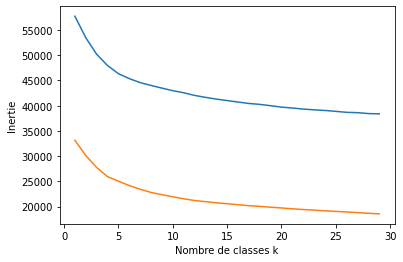

In [ ]:
X = [x_avg_bert, x_avg_roberta]

x = np.arange(1, 30)


for matrice in X:
  y = []
  for k in x:
    y.append(KMeans(k).fit(matrice).inertia_)
  plt.plot(x, y)

plt.xlabel("Nombre de classes k")
plt.ylabel("Inertie")
plt.show()

In [ ]:
k = 5

# Partie 1 : Méthodes Tandem

## Matrice BERT

### Méthodes de réduction de dimensions


Notre objectif ici est de reduire suffisament la dimension des données pour  pouvoir appliquer un clustering après mais egalement garder le plus d'information dans l'espace reduite pour distinguer au mieux les classes. Pour ce faire, nous effectuons une ACP sur les deux matrices et gardons les premières composantes qui renferment au moins 80% de l'information contenue dans les matrices

Nombre composantes considéré pour BERT : 104
Nombre composantes considéré pour RoBERTa : 69
Nombre composantes considéré pour Glove : 7
Nombre composantes considéré pour W2V : 99


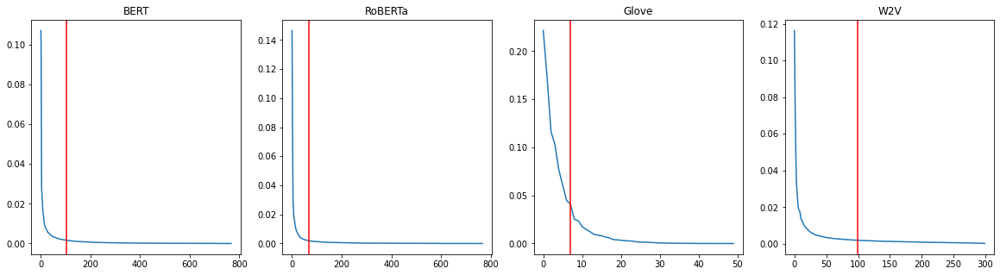

In [ ]:
fig = plt.figure(figsize=(20, 5))
axes = fig.subplots(1, 4)

X = [x_avg_bert, x_avg_roberta, x_glove, x_w2v]
X_label = ["BERT", "RoBERTa", "Glove", "W2V"]
n_composantes_pca = []

for j in range(4):
  pca = PCA()
  X_reduced_pca = pca.fit_transform(X[j])
  y = pca.explained_variance_ratio_

  n_composantes_pca.append(np.where(np.cumsum(y) > 0.80)[0][0])

  x_composantes = np.arange(X[j].shape[1])

  axes[j].plot(x_composantes, y)
  axes[j].set_title(X_label[j])
  axes[j].axvline(n_composantes_pca[j], color="red", label=f"Composante {n_composantes_pca[j]}")

fig.show()

for i in range(len(X_label)):
  print(f"Nombre composantes considéré pour {X_label[i]} : {n_composantes_pca[i]}")

100%|██████████| 200/200 [00:30<00:00,  6.49it/s]


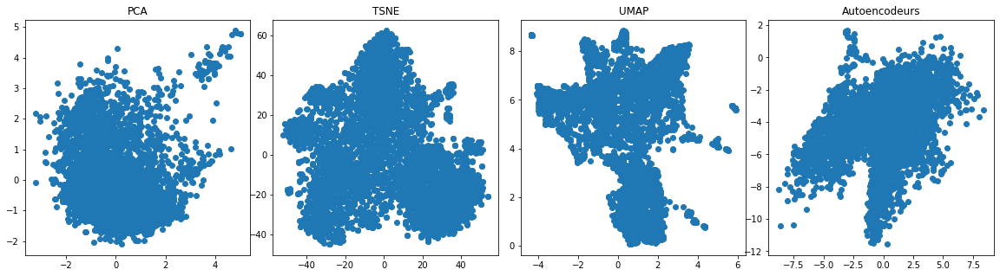

In [ ]:
X = x_avg_bert

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  axe.scatter(list_X[i][:, 0], list_X[i][:, 1])
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

### Clustering par k-means


100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


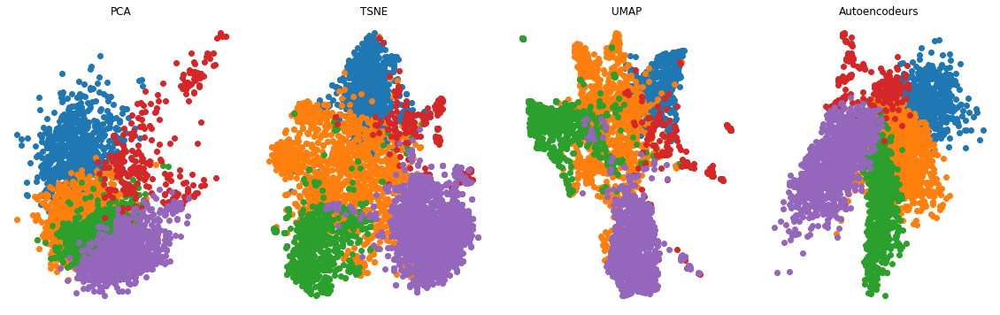

,PCA,TSNE,UMAP,Autoencodeurs
0,1.288,0.845132,0.765259,0.986823


In [ ]:
X = x_avg_bert

list_pred_labels = []
list_titles = list_X_titles

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

L'indice de Davies-Bouldin est une mesure de qualité d'une partition d'un ensemble de données en classification automatique.  C'est la moyenne du rapport maximal entre la distance d'un point au centre de son groupe et la distance entre deux centres de groupes. Plus il est proche de 0 est mieux c'est.

On constate que selon la métrique, le meilleur clustering est réalisé par UMAP suivi de TSNE, les autoencodeurs et enfin PCA.

Sur la visualisation, on observe qu'aucune des méthodes de réduction de dimension ne permet à l'algorithme k-means de bien séparer les 5 clusters définis précédemment. Toutefois, on constate que les clusters avec la méthode autoencodeurs sont plus homogènes.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:08<00:00,  5.77it/s]


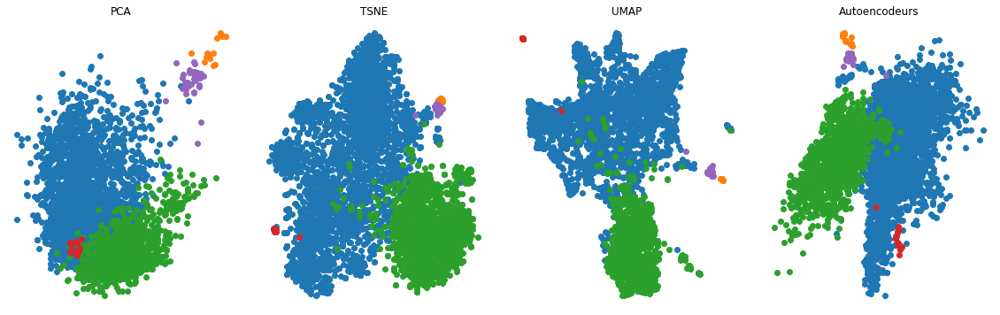

,PCA,TSNE,UMAP,Autoencodeurs
0,0.913975,0.699334,2.330463,0.714444


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Avec l'algorithme spectral k-means, la métrique davies bouldin affiche le meilleur score pour la TSNE, suivi des autoencodeurs.

Sur la visualisation, on observe la présence majoritaire de 2 clusters. Les 3 autres clusters sont constitués que de quelques points. En se basant sur cela, il semble que l'algorithme a mal classé les points.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:08<00:00,  5.71it/s]


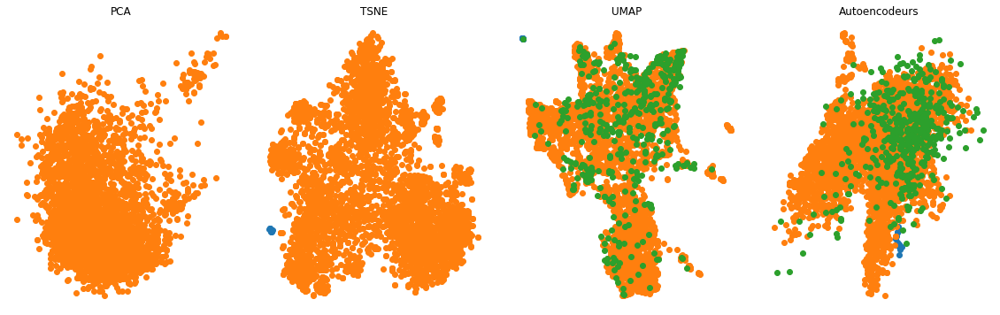

,PCA,TSNE,UMAP,Autoencodeurs
0,4.122124,0.906733,1.261423,2.055245


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Selon la métrique de Davies Bouldin, la TSNE permet de former les meilleurs clusters.

Sur la visualisation, on observe la présence majoritaire de 2 clusters, les 3 autres sont minoritaires. On peut donc penser que HDBSCAN n'est pas adapté pour ces données.

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:06<00:00,  7.28it/s]


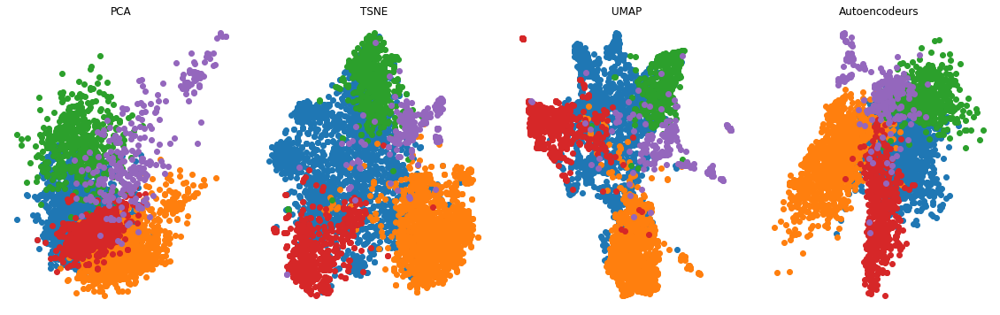

,PCA,TSNE,UMAP,Autoencodeurs
0,2.31689,0.884903,0.822346,1.005409


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Selon  la métrique de Davies Boulvin, les méthodes TSNE et UMAP sont à l'origine des meilleurs clusters.

Sur la visualisation, on remarque des clusters qui ne sont pas séparés. 

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


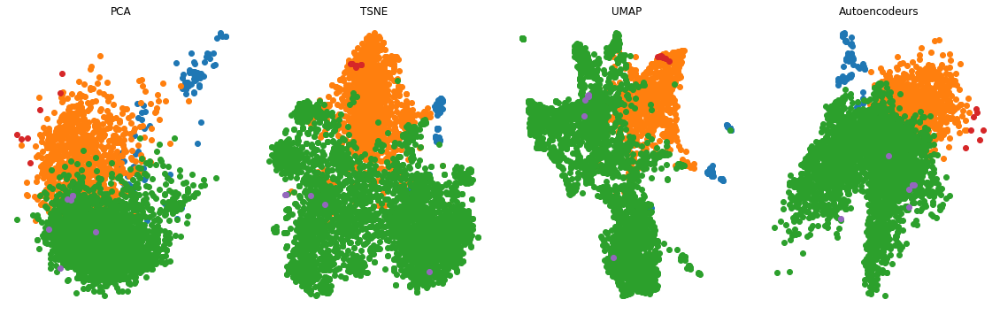

,PCA,TSNE,UMAP,Autoencodeurs
0,1.863595,0.92498,0.659359,1.178871


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Selon la métrique de Davies Bouldin, UMAP permet de former les meilleurs clusters.

Sur la visualisation, on observe la présence majoritaire de 2 clusters, les 3 autres sont minoritaires. On peut donc penser que l'algorithme n'est pas adapté pour ces données.

Pour la matrice BERT, on peut conclure que les algorithmes spectral k-means, HDBSCAN et CAH avec distance moyenne ne sont pas adaptés car ils identifient généralement qu'un ou deux clusters. Les autres clusters représentent que quelques individus.

## Matrice RoBERTa

### Réduction de dimensions

100%|██████████| 200/200 [00:33<00:00,  5.93it/s]


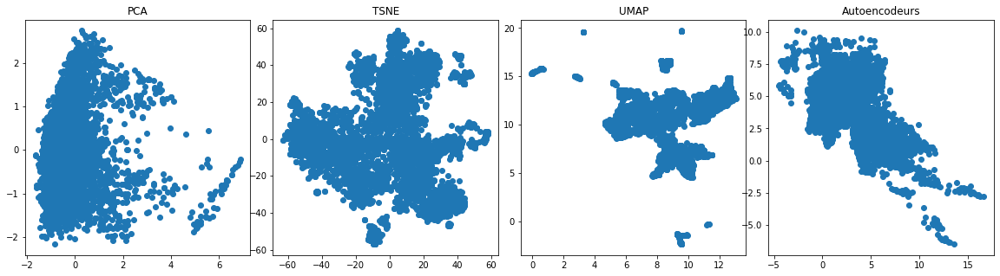

In [ ]:
X = x_avg_roberta

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  axe.scatter(list_X[i][:, 0], list_X[i][:, 1])
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

Sur la visualisation, on ne voit pas de clusters distincts.

### Clustering par k-means


100%|██████████| 50/50 [00:07<00:00,  7.13it/s]


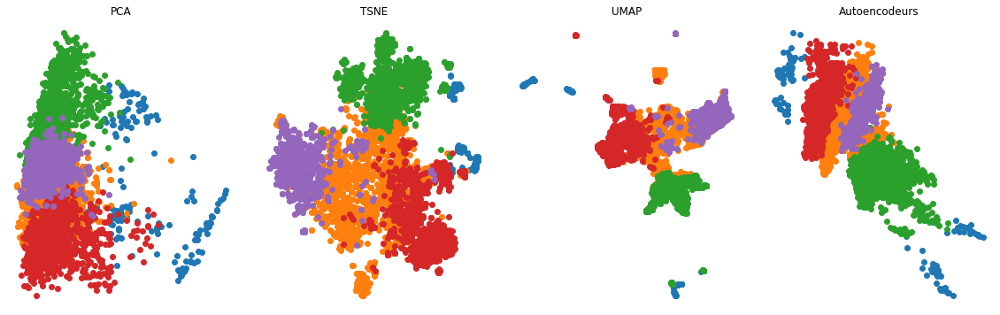

,PCA,TSNE,UMAP,Autoencodeurs
0,1.047143,0.896884,0.701891,5.286554


In [ ]:
list_pred_labels = []
list_titles = list_X_titles

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Selon notre métrique, UMAP est la plus efficace pour former des clusters.

Sur la visualisation, on peut observer pour UMAP des clusters assez denses.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:07<00:00,  6.29it/s]


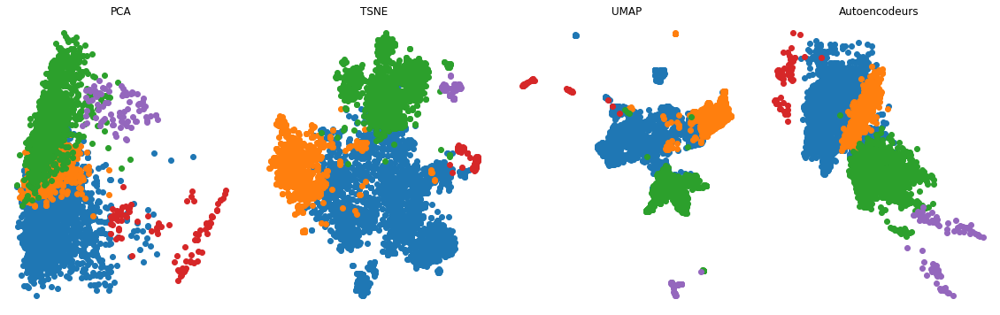

,PCA,TSNE,UMAP,Autoencodeurs
0,1.303177,0.731193,0.67165,0.906622


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Selon la métrique, UMAP a le mieux classer les points dans des clusters.

Sur la visualisation, on n'arrive pas à voir des clusters distincts.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:08<00:00,  5.59it/s]


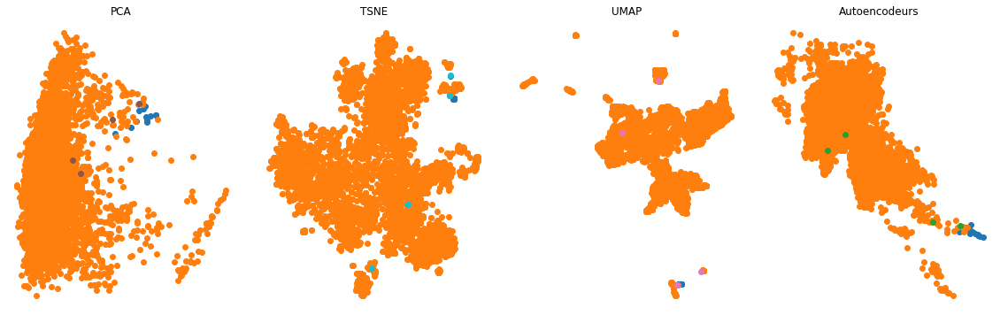

,PCA,TSNE,UMAP,Autoencodeurs
0,1.228561,1.304772,1.217244,1.477618


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

Selon la métrique, UMP a réalisé les meilleures performances. Toutefois sur la visualisation, on remarque la présence majoritaire d'un seul cluster. On peut donc penser que HDBSCAN n'est pas adapté.

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


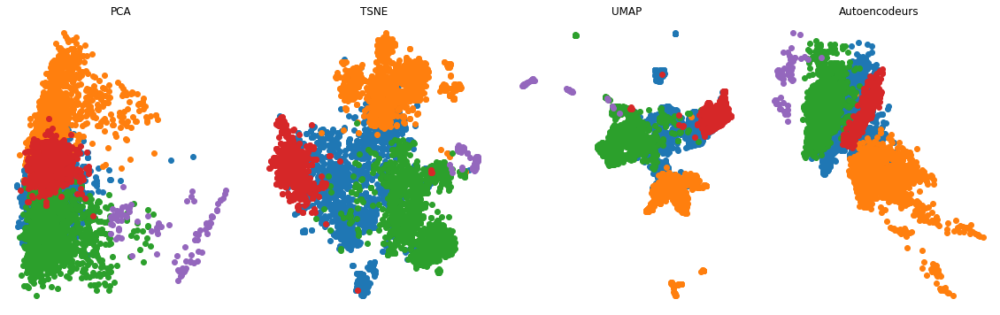

,PCA,TSNE,UMAP,Autoencodeurs
0,1.19585,0.953485,0.737644,1.449592


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

UMAP affiche les meilleur score. Sur la visualisation toutefois, les clusters se superposent.  

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


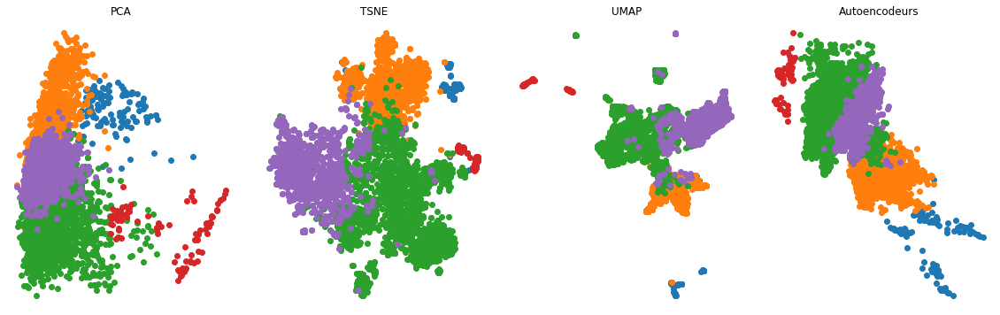

,PCA,TSNE,UMAP,Autoencodeurs
0,0.836007,0.764854,0.595748,1.054785


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

UMAP a le meilleur score. Sur la visualisation, on voit 2 classes minoritaires par rapport aux autres.

Pour la matrice RoBERTa, on peut conclure que l'algorithme HDBSCAN et CAH n'est pas adapté car il identifie qu'un seul clusters. Les 4 autres clusters contiennent que quelques individus.

## Matrice Glove

100%|██████████| 200/200 [00:31<00:00,  6.38it/s]


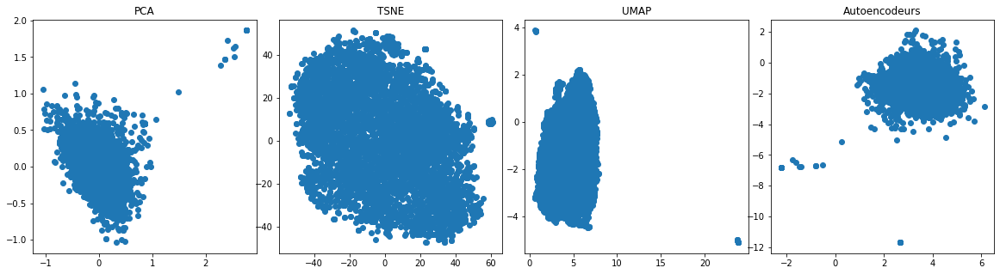

In [ ]:
X = x_glove

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  axe.scatter(list_X[i][:, 0], list_X[i][:, 1])
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

In [ ]:
Pour chacune des méthodes, on observe une forme soit sphérique, soit longitudinale. Il sera donc difficile de distinguer des clusters.

### Clustering par k-means


100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


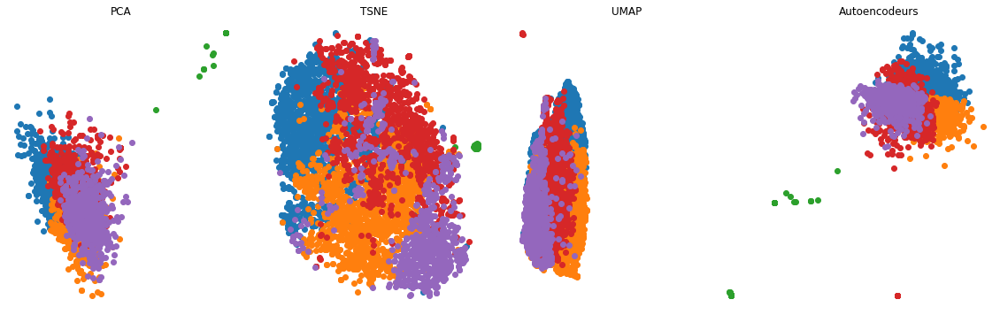

,PCA,TSNE,UMAP,Autoencodeurs
0,1.61042,0.852935,0.666695,1.515105


In [ ]:
list_pred_labels = []
list_titles = list_X_titles

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[2], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, les clusters sont entassées les un sur les autres.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:07<00:00,  7.10it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embeddi

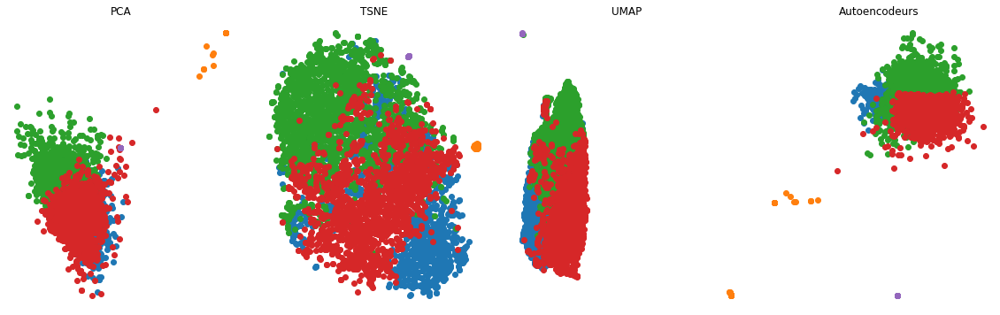

,PCA,TSNE,UMAP,Autoencodeurs
0,1.918914,0.761317,0.703457,1.056174


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[2], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, les clusters sont entassées les un sur les autres.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:07<00:00,  7.14it/s]


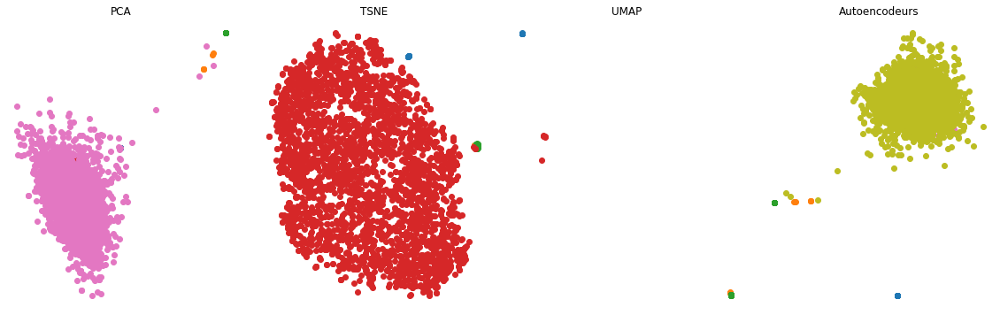

,PCA,TSNE,UMAP,Autoencodeurs
0,2.277313,1.359196,0.295321,1.750882


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[2], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:06<00:00,  7.59it/s]


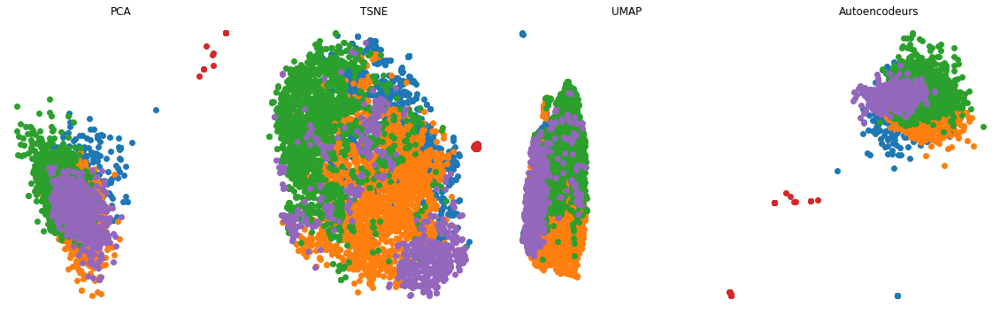

,PCA,TSNE,UMAP,Autoencodeurs
0,1.536793,0.898851,0.748142,1.390897


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[2], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, les clusters sont entassées les un sur les autres.

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:08<00:00,  5.65it/s]


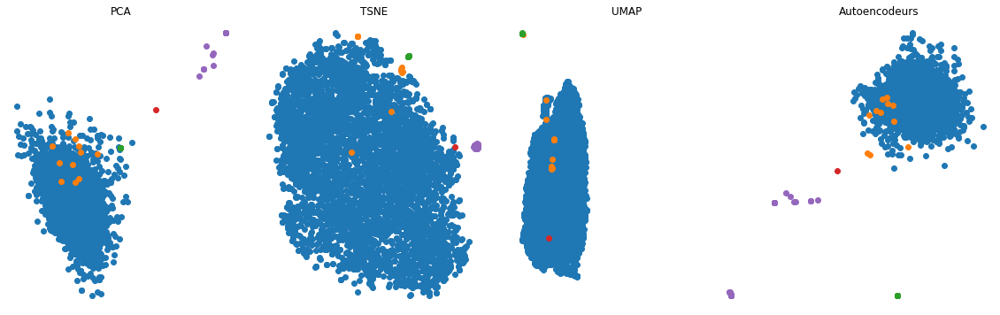

,PCA,TSNE,UMAP,Autoencodeurs
0,0.984,0.831303,0.614745,0.653555


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[2], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, il n'y a pratiquement qu'un seul cluster.

Pour la matrice glove, on peut conclure que les algorithmes HDBSCAN et CAH avec distance moyenne ne sont pas adaptés car ils identifient généralement qu'un ou deux clusters. Les autres clusters représentent que quelques individus.

## Matrice Word2Vec

100%|██████████| 200/200 [00:26<00:00,  7.43it/s]


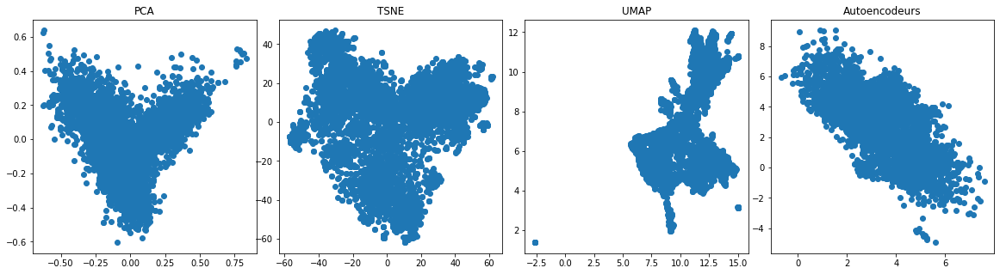

In [ ]:
X = x_w2v

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  axe.scatter(list_X[i][:, 0], list_X[i][:, 1])
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

Sur la visualisation, on ne constate aucune cluster distinct.

### Clustering par k-means


100%|██████████| 50/50 [00:07<00:00,  6.42it/s]


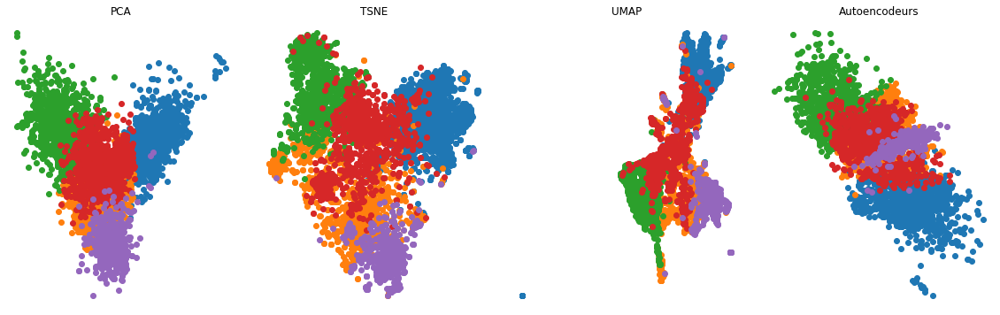

,PCA,TSNE,UMAP,Autoencodeurs
0,1.208451,0.763018,0.786117,3.001204


In [ ]:
list_pred_labels = []
list_titles = list_X_titles

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[3], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode TSNE a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, les clusters sont entassées les un sur les autres.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:08<00:00,  5.71it/s]


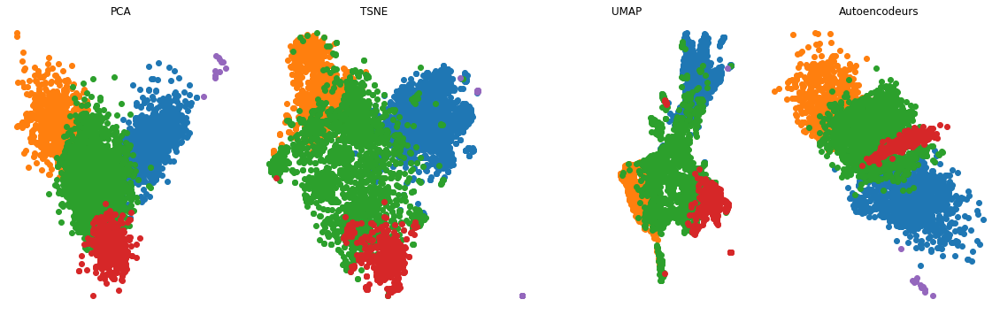

,PCA,TSNE,UMAP,Autoencodeurs
0,1.035565,0.746732,0.564286,0.990351


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[3], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, on observe un cluster qui est majoritaire et un autre qui est minoritaire.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:08<00:00,  5.99it/s]


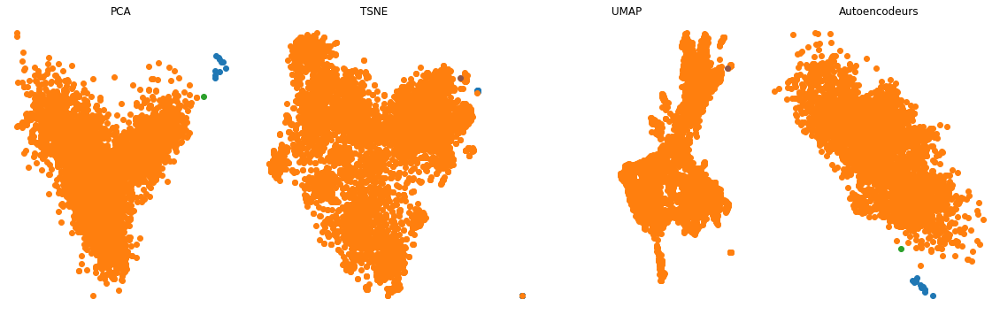

,PCA,TSNE,UMAP,Autoencodeurs
0,0.407579,1.375137,1.436499,0.374943


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[3], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, on observe principalement qu'un seul cluster.

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:08<00:00,  5.60it/s]


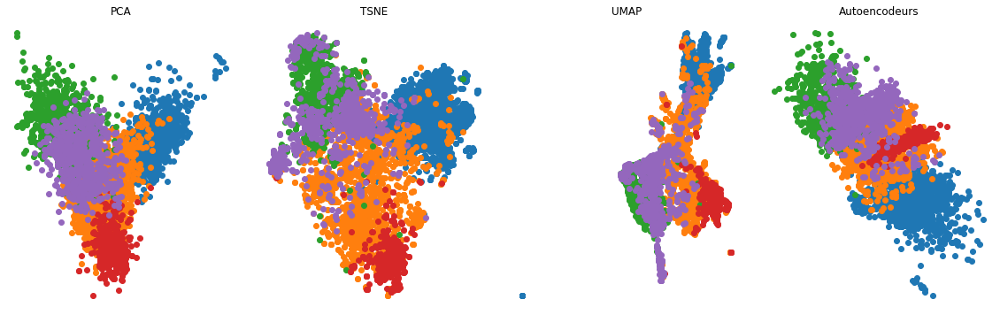

,PCA,TSNE,UMAP,Autoencodeurs
0,1.602259,0.879384,0.844938,1.61541


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[3], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, les clusters sont entassés les un sur les autres.

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:06<00:00,  7.36it/s]


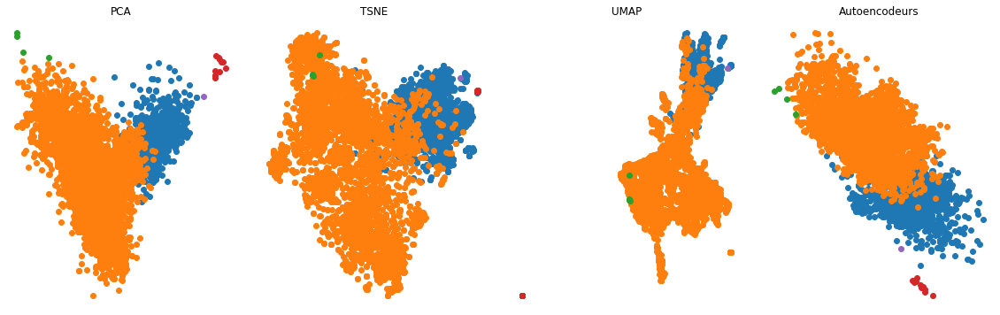

,PCA,TSNE,UMAP,Autoencodeurs
0,0.489003,0.803067,0.528394,0.554262


In [ ]:
list_pred_labels = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[3], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  list_pred_labels.append(pred_labels)

affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric(list_X, list_pred_labels, list_titles)

La méthode UMAP a le meilleur score pour la métrique Davies Bouldin. 

Sur la visualisation, on observe la présence majoritaire de 2 clusters

Pour la matrice Word2vec, on peut conclure que les algorithmes HDBSCAN et CAH avec distance moyenne ne sont pas adaptés car ils identifient généralement qu'un ou deux clusters. Les autres clusters représentent que quelques individus.

Pour la partie 1, on constate que les algorithmes HDBSAN et CAH avec distance moyenne forment des clusters très déséquilibrés quelque soit la représentation textuelle. On s'aperçoit qu'il est difficile de mesurer la qualité de classification automatique. En effet, la métrique utilisée pour mesurer la qualité des clusters, indice de Davies-Bouldin, affiche de bons scores alors que visuellement on ne voit qu'un cluster.   

# Partie 2 



In [ ]:
k = 5

def affichage2DUnique(X, pred_labels):
  for j in set(pred_labels):
    plt.scatter(X[pred_labels==j, 0], X[pred_labels==j, 1], label=str(j))
  plt.show()

## Matrices BERT

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_avg_bert.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(rkm[0])
list_X.append(rkm[1][0])


# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(fkm[0])
list_X.append(fkm[1][0])


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)


# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

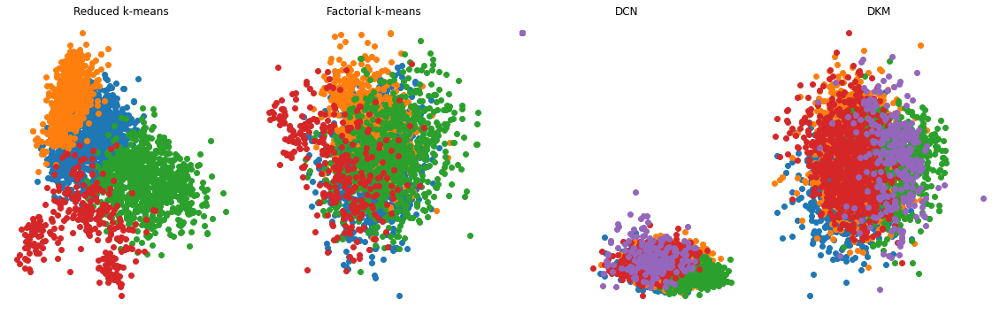

,Reduced k-means,Factorial k-means,DCN,DKM
0,3.006784,3.035179,3.106931,3.151419


In [ ]:
affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric([X.copy()] * 4, list_pred_labels, list_titles)

On remarque ici que le Reduced k-means arrive à degager une certaine forme de cluster alors que le Deep Clustering Network (DCN) par exemple nous donne une representation 2D moins satisfaisante. Toutefois, si le resultat produit par le DCN est moins interpretable, la force de l'algorithme reside dans le fait qu'au lieu d'apprendre la structure des données, il extrait des representations de données utiles au clustering, ce qui se traduit souvent par une meilleure performance au niveau des métriques.

## Matrices RoBERTa

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_avg_roberta.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(rkm[0])
list_X.append(rkm[1][0])


# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(fkm[0])
list_X.append(fkm[1][0])


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)


# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

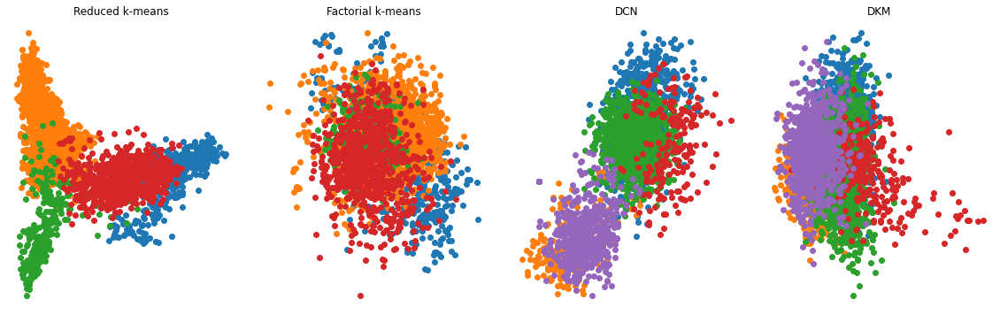

,Reduced k-means,Factorial k-means,DCN,DKM
0,2.906683,2.766743,2.958501,2.567336


In [ ]:
affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric([X.copy()] * 4, list_pred_labels, list_titles)

Comparé aux resultats obtenus avec la matrice BERT, on observe des meilleurs avec la matrice roBERTa quant au structure des classes prédites. En effet, les scores DBI sont légèrement meilleurs qu'avec la matrice précedente.

## Matrice Word2Vec

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_w2v.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(rkm[0])
list_X.append(rkm[1][0])


# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(fkm[0])
list_X.append(fkm[1][0])


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)


# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

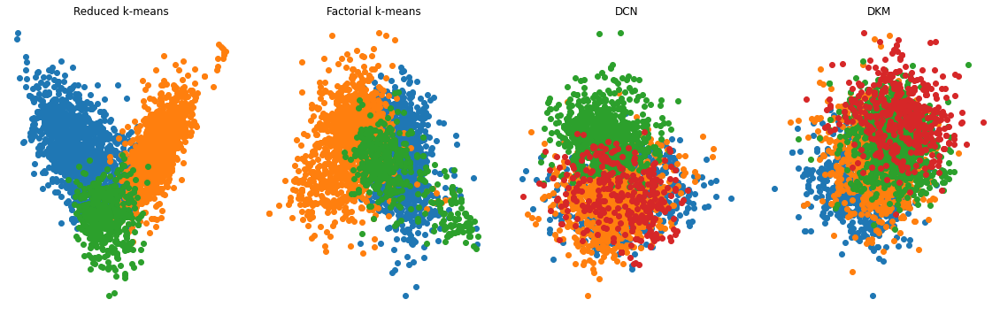

,Reduced k-means,Factorial k-means,DCN,DKM
0,3.37113,3.229179,3.378505,3.351644


In [ ]:
affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric([X.copy()] * 4, list_pred_labels, list_titles)

Avec la matrice Word2Vec, nous remarquons que les résultats globaux sont plutôt mauvais. Pour les algorithmes reduced k-means et factorial k-means, deux des cinq classes sont completement confondues avec le reste. C'est un phenomène qu'on a déjà pu observé sur les données labelisées. Utiliser uniquement ces algorithmes peut donc être contre-productif car cela poserait non seulement un problème d'interpretation mais pousserait également à reflechir sur le choix du nombre de clusters.

## Matrice glove

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_glove.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(rkm[0])
list_X.append(rkm[1][0])


# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

list_pred_labels.append(fkm[0])
list_X.append(fkm[1][0])


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)


# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

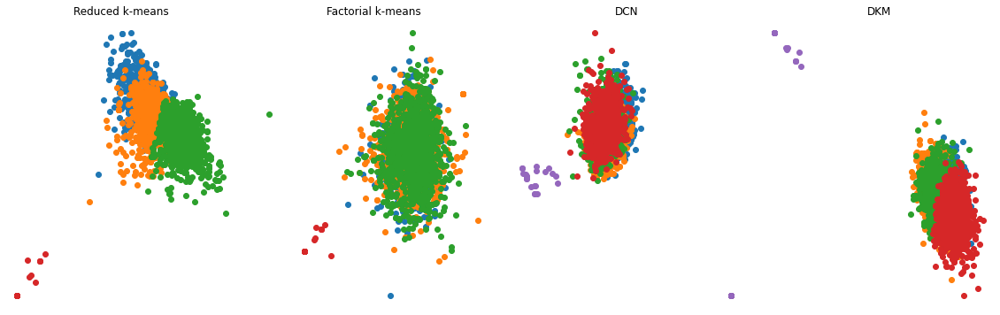

,Reduced k-means,Factorial k-means,DCN,DKM
0,1.770274,1.826282,1.839036,1.76615


In [ ]:
affichage2D(list_X, list_pred_labels, list_titles)
davies_bouldin_metric([X.copy()] * 4, list_pred_labels, list_titles)

Ici nous constatons les limites de la representation des documents par la matrice glove. Tous les points obtenus aux travaers des regroupements des quatres algorithmes sont proches les uns des autres alors que pour les matrices ci haut on pouvait observer clairement certains clusters. On pourrait conclure que la matrice glove n'a pas su garder les propriétés importantes à la definition des documents. 

#<font color='red'> Analyse de la dataset ***bbc*** </font>

## Importation des données

In [ ]:
chemin = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/data/bbc.csv"
bbc = pd.read_csv(chemin, index_col=0)
texts = bbc['text']
labels = bbc['label']

print(bbc)

nombre_de_classes = len(labels.value_counts())

labels = LabelEncoder().fit_transform(labels)

                                                   text     label
0     England coach faces rap after row\n\nEngland c...     sport
1     Moody joins up with England\n\nLewis Moody has...     sport
2     Ferguson fears Milan cutting edge\n\nMancheste...     sport
3     Henry tipped for Fifa award\n\nFifa president ...     sport
4     Arnesen denies rift with Santini\n\nTottenham ...     sport
...                                                 ...       ...
2220  Commons hunt protest charges\n\nEight proteste...  politics
2221  UK set to cut back on embassies\n\nNine overse...  politics
2222  'Few ready' for information act\n\nThousands o...  politics
2223  Goldsmith: 'I was not leant on'\n\nThe attorne...  politics
2224  Hewitt decries 'career sexism'\n\nPlans to ext...  politics

[2225 rows x 2 columns]


## Nettoyage des données

In [ ]:
texts = clean_abstracts(texts)

In [ ]:
def affichage(list_X, list_pred_labels, labels, list_titles):
  fig = plt.figure(figsize=(24,14))
  outer = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.3)

  ligne = 0
  
  for ligne_i in range(2):
    for i in range(2):
      # set outer titles
      ax = plt.Subplot(fig, outer[ligne_i, i])
      ax.set_title(list_titles[ligne], fontsize=15)
      ax.axis('off')
      fig.add_subplot(ax)

      inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[ligne_i, i], wspace=0.1, hspace=0.1)
      
      ax1 = plt.Subplot(fig, inner[0])
      for j in set(labels):
        ax1.scatter(list_X[ligne][labels==j, 0], list_X[ligne][labels==j, 1], label=str(j))
      ax1.set_title("True labels", fontsize=10)
      fig.add_subplot(ax1)

      ax2 = plt.Subplot(fig, inner[1])
      for j in set(list_pred_labels[ligne]):
        ax2.scatter(list_X[ligne][list_pred_labels[ligne]==j, 0], list_X[ligne][list_pred_labels[ligne]==j, 1], label=str(j))
      ax2.set_title("Pred labels", fontsize=10)
      fig.add_subplot(ax2)

      ligne = ligne + 1
  fig.show()

  # Affichage des matrices de confusion
  fig_confusion_matrix = plt.figure(figsize=(24,5))
  outer_cm = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

  for i in range(4):
    axe = plt.Subplot(fig_confusion_matrix, outer_cm[i])
    cm_plot = ConfusionMatrixDisplay(confusion_matrix(labels, list_pred_labels[i]), display_labels=set(labels)).plot(ax=axe)
    cm_plot.ax_.set_title(f"Matrice de confusion {list_X_titles[i]}")
    fig_confusion_matrix.add_subplot(axe)
    
  fig_confusion_matrix.show()


# comparaison entre les vrais labels et des labels prédits
def eval_clustering_2D(X_reduced, labels_pred, labels_true):

  print('\nAccuracy : ', round(accuracy(labels_true, labels_pred), 2))
  print('NMI : ', round(normalized_mutual_info_score(labels_true, labels_pred), 2))
  print('ARI : ', round(adjusted_rand_score(labels_true, labels_pred), 2))

  color = ['red', 'blue', 'green', 'yellow', 'purple', 'brown', 'pink', 'gray', 'black']

  fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey='row')

  for i in set(labels_pred.tolist()):
    axes[0].scatter(X_reduced[labels_pred == i, 0], X_reduced[labels_pred == i, 1], s = 50, c = color[i], label = 'Cluster ' + str(i))
  axes[0].set_title("predicted labels")
  axes[0].legend()

  for i in set(labels_true.tolist()):
    axes[1].scatter(X_reduced[labels_true == i, 0], X_reduced[labels_true == i, 1], s = 50, c = color[i], label = 'Cluster ' + str(i))
  axes[1].set_title("true labels")
  axes[1].legend()

  plt.show()

  print()

  fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey='row')

  cf_matrix = confusion_matrix(labels_true, labels_pred)
  disp = ConfusionMatrixDisplay(cf_matrix, display_labels=set(labels_true))
  disp.plot(ax=axes[0])
  disp.ax_.set_title("Confusion matrix, without normalization")

  cf_matrix2 = confusion_matrix(labels_true, labels_pred, normalize='all')
  disp2 = ConfusionMatrixDisplay(cf_matrix2, display_labels=set(labels_true))
  disp2.plot(ax=axes[1])
  disp2.ax_.set_title("Normalized confusion matrix")

  plt.subplots_adjust(wspace=0.40, hspace=0.1)

  plt.show()

## Embeddings

#### BERT

In [ ]:
def compute_average_embeddings(matrices):
  matrices = np.swapaxes(matrices, 0, 1)
  word_vectors = [matrix.mean(axis=0) for matrix in matrices]
  avg_matrix = np.vstack(word_vectors)
  return avg_matrix

def compute_concat_embeddings(matrices):
  return np.hstack(matrices)

In [ ]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

In [ ]:
model_name = "bert-base-cased"
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained(model_name)

if device == "cuda":
    model.cuda()

bert_embeddings = utils.encode_sentences_batch(model, tokenizer, texts, batch_size=32)

x_concat_bert = compute_concat_embeddings(bert_embeddings)
x_avg_bert = compute_average_embeddings(bert_embeddings)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
print("Dimensions de la matrice x_concat_bert : ", x_concat_bert.shape)
print("Dimensions de la matrice x_avg_bert : ", x_avg_bert.shape)

Dimensions de la matrice x_concat_bert :  (2225, 9216)
Dimensions de la matrice x_avg_bert :  (2225, 768)


#### RoBERTa

In [ ]:
model_name = "roberta-base"
model = RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = RobertaTokenizer.from_pretrained(model_name)

if device == "cuda":
    model.cuda()
    
roberta_embeddings = utils.encode_sentences_batch(model, tokenizer, bbc['text'], batch_size=32)

x_concat_roberta = compute_concat_embeddings(roberta_embeddings)
x_avg_roberta = compute_average_embeddings(roberta_embeddings)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
print("Dimensions de la matrice x_concat_roberta : ", x_concat_roberta.shape)
print("Dimensions de la matrice x_avg_roberta : ", x_avg_roberta.shape)

Dimensions de la matrice x_concat_roberta :  (2225, 9216)
Dimensions de la matrice x_avg_roberta :  (2225, 768)


# Partie 1 : Méthodes Tandem

## Matrice BERT

### Méthodes de réduction de dimensions



Nombre composantes considéré pour x_avg_bert : 66
Nombre composantes considéré pour x_avg_roberta : 23



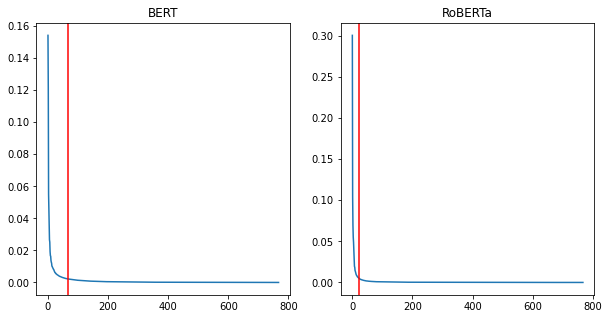

In [ ]:
fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(1, 2)

X = [x_avg_bert, x_avg_roberta]
X_label = ["BERT", "RoBERTa"]
n_composantes_pca = []

for j in range(2):
  pca = PCA()
  X_reduced_pca = pca.fit_transform(X[j])
  y = pca.explained_variance_ratio_

  n_composantes_pca.append(np.where(np.cumsum(y) > 0.80)[0][0])

  x_composantes = np.arange(X[j].shape[1])

  axes[j].plot(x_composantes, y)
  axes[j].set_title(X_label[j])
  axes[j].axvline(n_composantes_pca[j], color="red", label=f"Composante {n_composantes_pca[j]}")

fig.show()

print(f"Nombre composantes considéré pour x_avg_bert : {n_composantes_pca[0]}\nNombre composantes considéré pour x_avg_roberta : {n_composantes_pca[1]}\n")

100%|██████████| 200/200 [00:19<00:00, 10.47it/s]


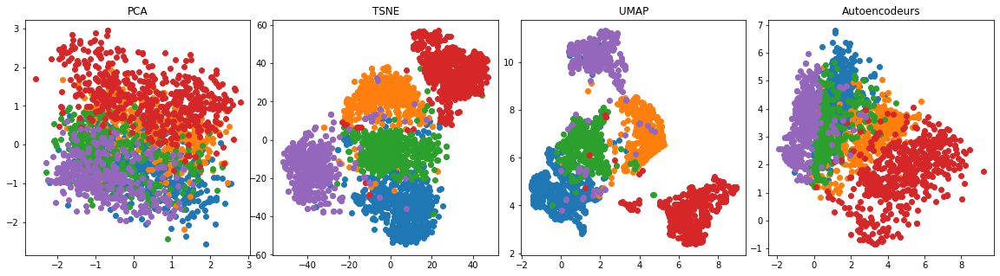

In [ ]:
X = x_avg_bert

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

La méthode UMAP sépare le mieux les clusters, elle est suivie par TSNE.

### Clustering par k-means




100%|██████████| 50/50 [00:03<00:00, 13.16it/s]


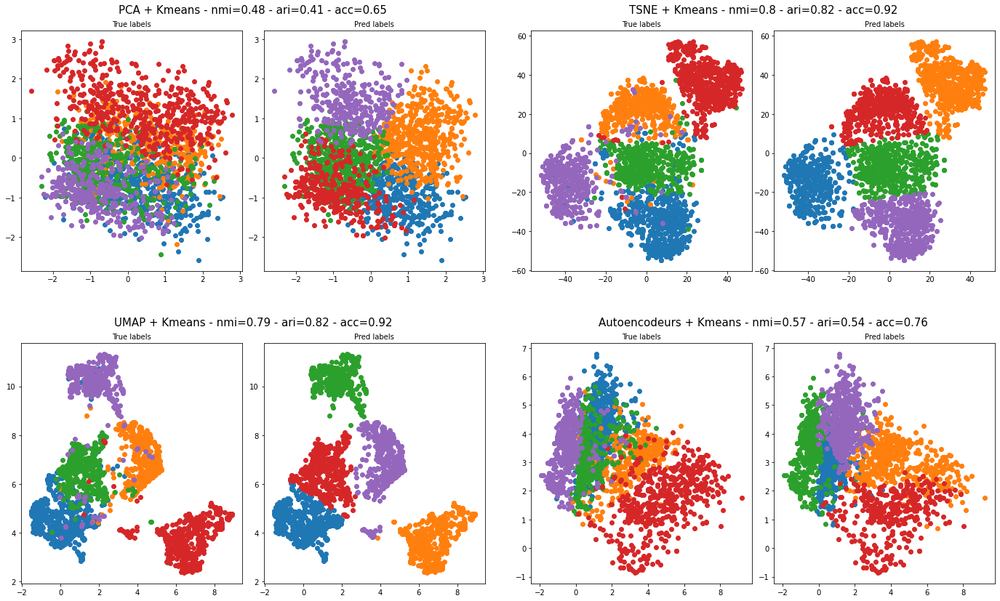

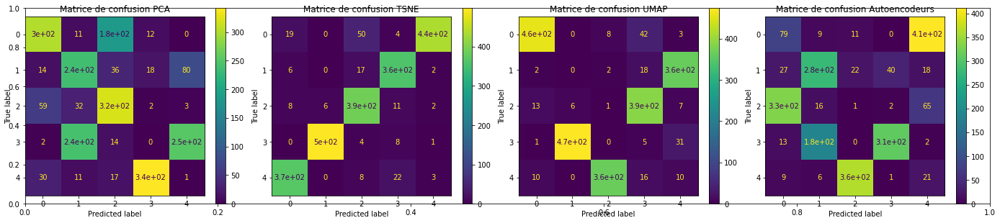

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
  nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
  ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme k-means, la réduction de dimensions par TSNE et UMAP affichent de très bon résultats.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:03<00:00, 12.99it/s]


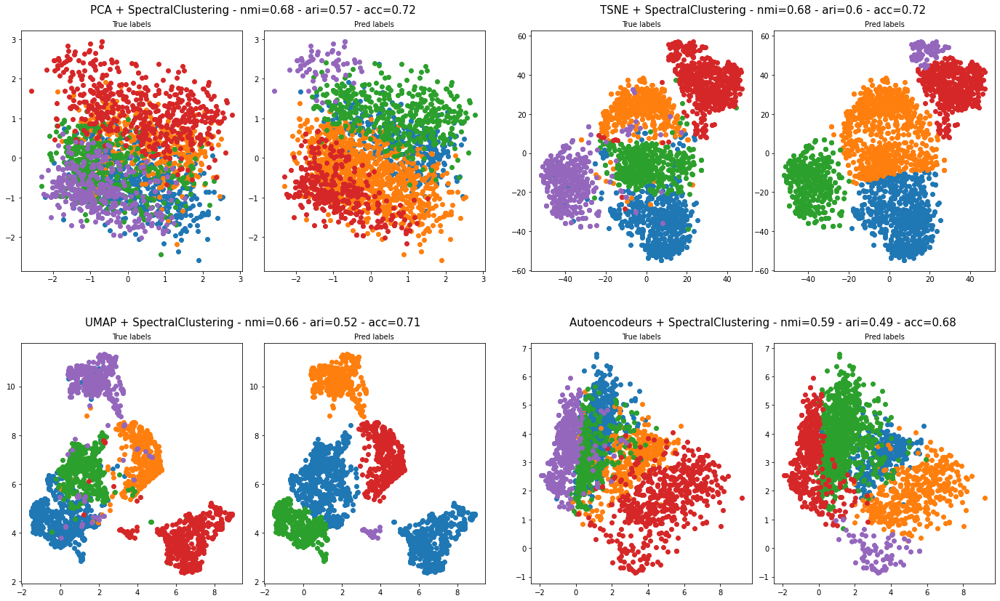

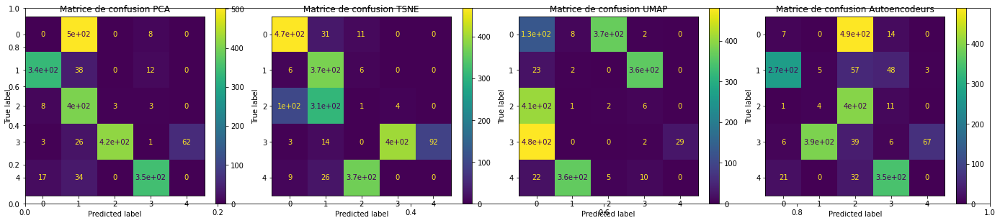

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Les métriques affichent des scores moyens pour les 4 méthodes, il n'y pas de différence significative entre elles.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


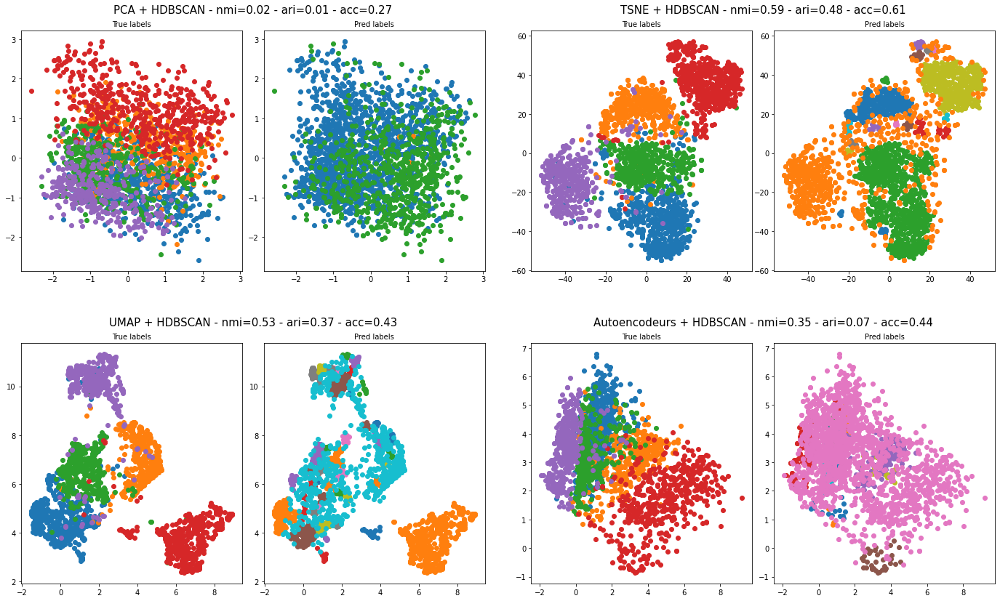

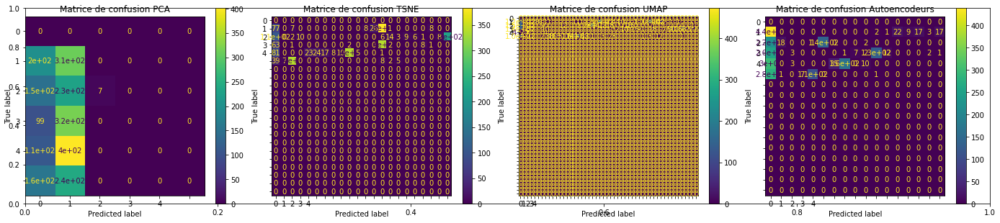

In [ ]:
X = x_avg_bert

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme HDBCAN, les résultats sont mauvais après la réduction de dimensions. 

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:05<00:00,  9.90it/s]


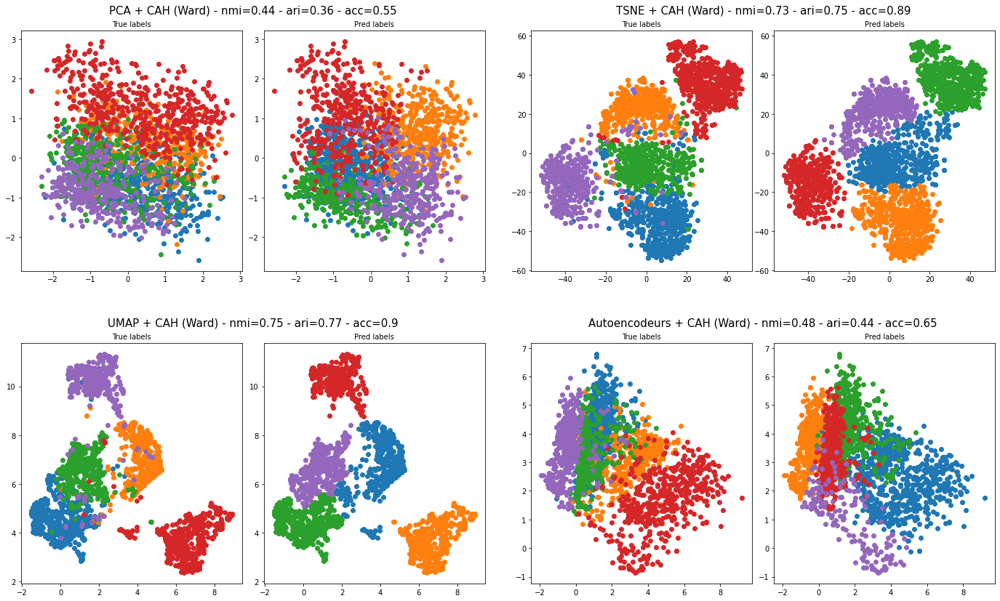

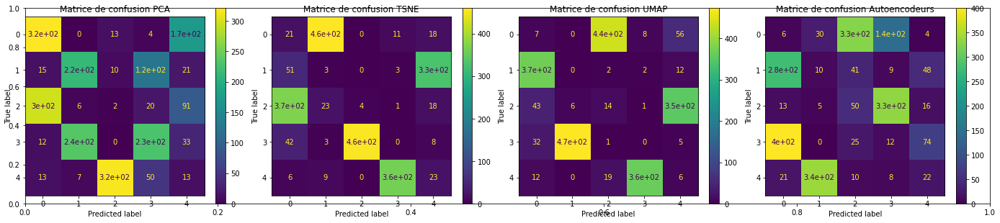

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Ici, c'est la TSNE et l'UMAP qui ont les meilleurs résultats pour les métriques.

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:04<00:00, 10.42it/s]


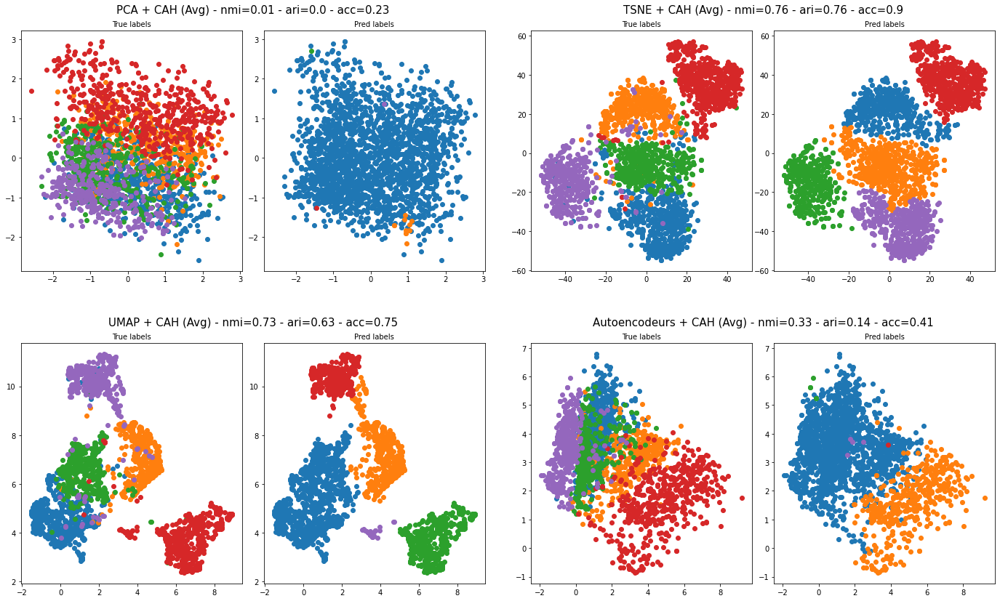

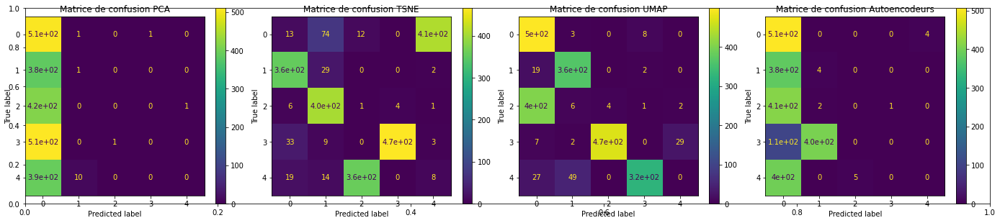

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Avg) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

TSNE affiche les meilleurs scores tandis la PCA a les plus mauvais.

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.49  0.48   0.8  0.79          0.57
Spectral k-means                   0.72  0.68  0.68  0.66          0.59
HDBSCAN                            0.03  0.02  0.59  0.53          0.35
CAH + Ward                         0.47  0.44  0.73  0.75          0.48
CAH + distance moyenne             0.01  0.01  0.76  0.73          0.33 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.41  0.41  0.82  0.82          0.54
Spectral k-means                   0.61  0.57   0.6  0.52          0.49
HDBSCAN                            0.01  0.01  0.48  0.37          0.07
CAH + Ward                         0.39  0.36  0.75  0.77          0.44
CAH + distance moyenne                0     0  0.76  0.63          0.14 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.

Tout d'abord, on remarque que l'application de la PCA ou non avant le clustering n'a pas d'effets sur les résultats.

L'algorithme spectral k-means a légérement de meilleurs résultats sans réduction de dimensions. 

L'utilisation des méthodes TSNE et UMAP avant HDBSCAN et CAH avec distance moyenne améliore significativement les résultats.

On en conclut que les méthodes de réductions les plus intéressantes pour la matrice Bert sont TSNE et UMAP, et en particulier pour k-means.

## Matrice RoBERTa

### Méthodes de réduction de dimensions


100%|██████████| 200/200 [00:15<00:00, 12.96it/s]


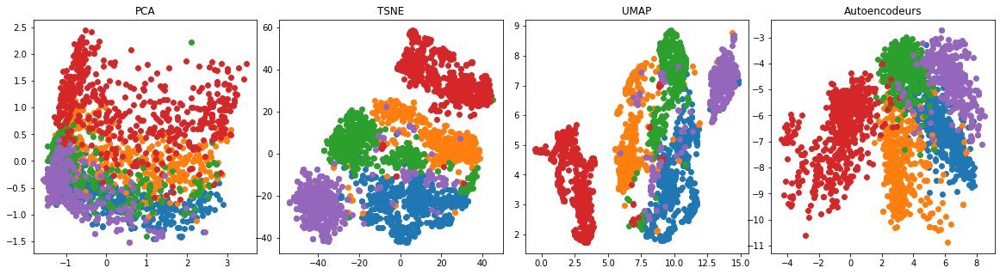

In [ ]:
X = x_avg_roberta

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

Les méthodes TSNE et UMAP séparent le mieux les clusters.

### Clustering par k-means


100%|██████████| 50/50 [00:03<00:00, 13.42it/s]


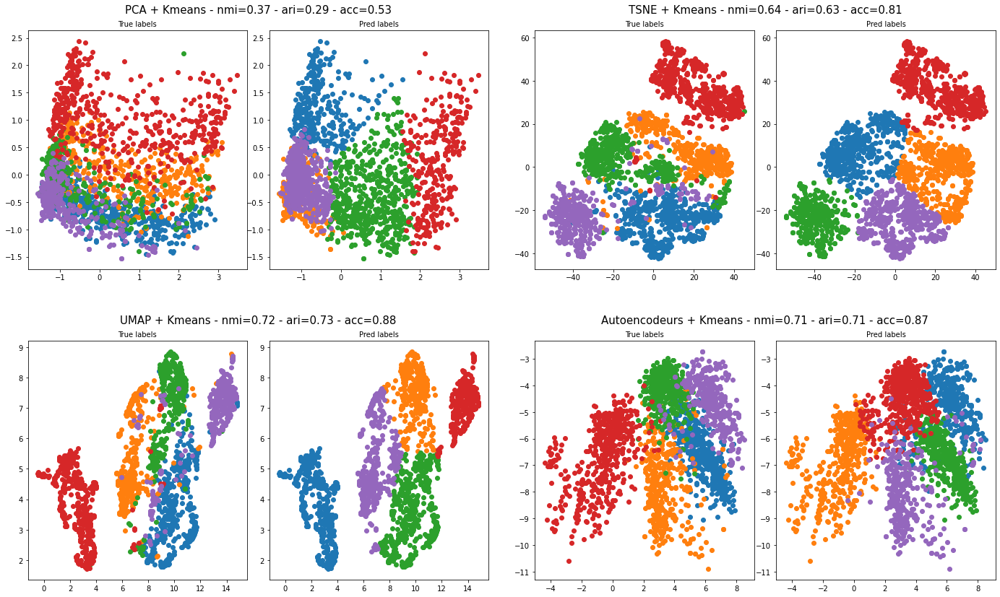

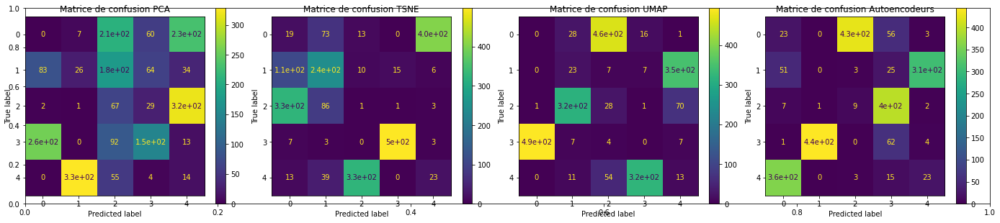

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme k-means, on a les meilleurs résultats avec UMAP et les autoencodeurs. 

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:04<00:00, 12.12it/s]


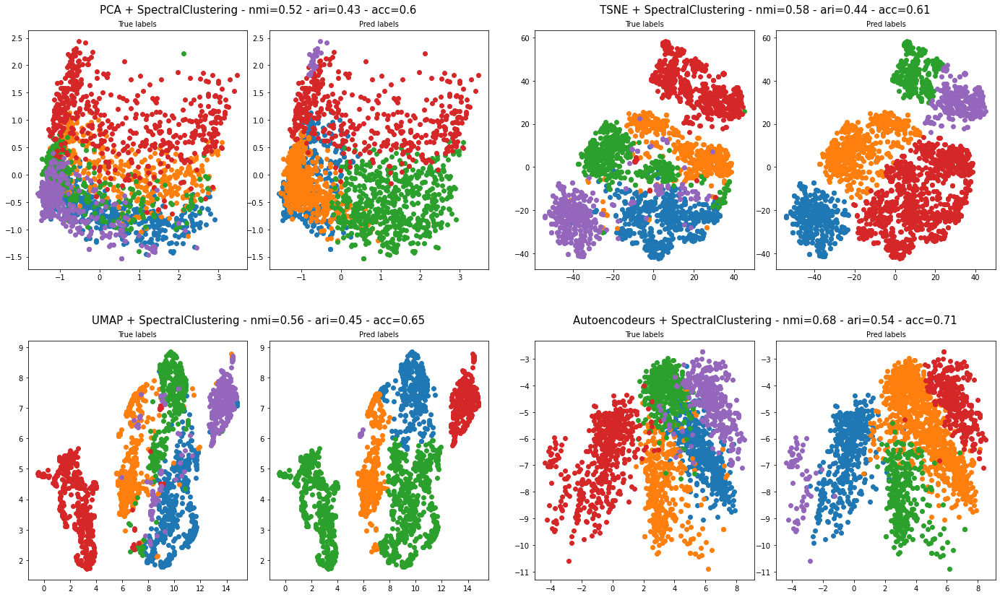

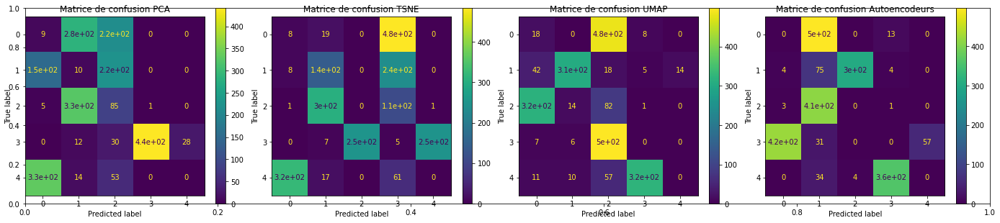

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

On a les meilleurs résultats avec les autoencodeurs.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


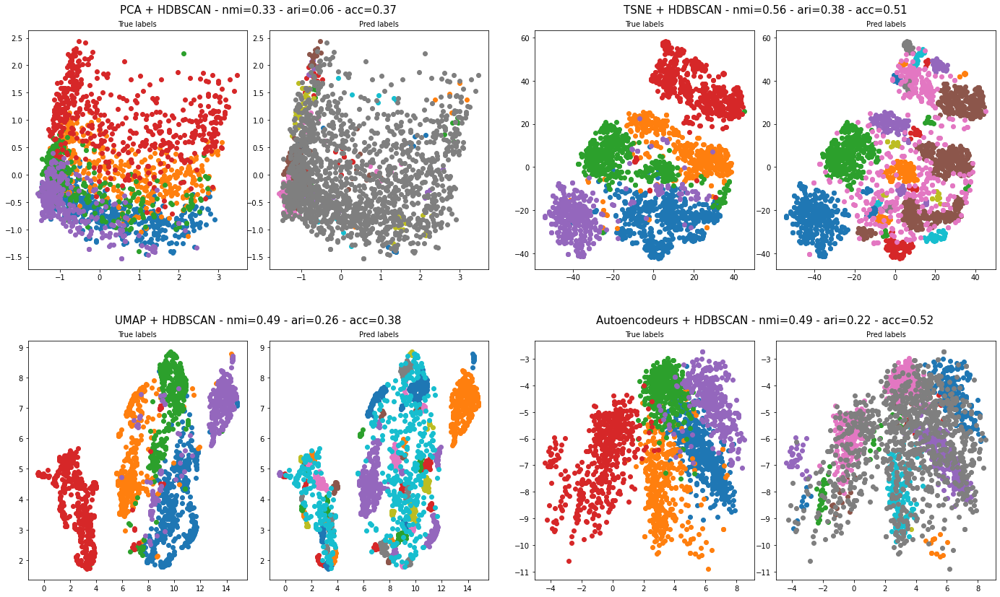

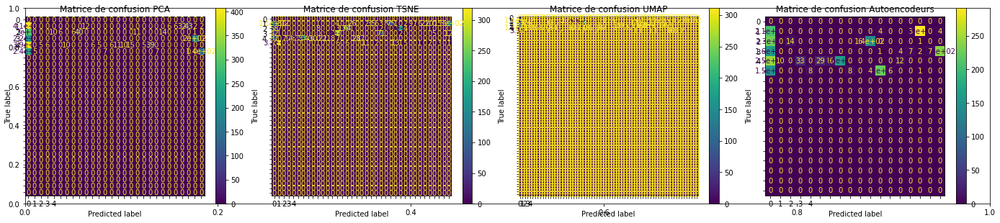

In [ ]:
X = x_avg_roberta

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

On a de très mauvais résultats quelque soit la méthode de réduction de dimensions.

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


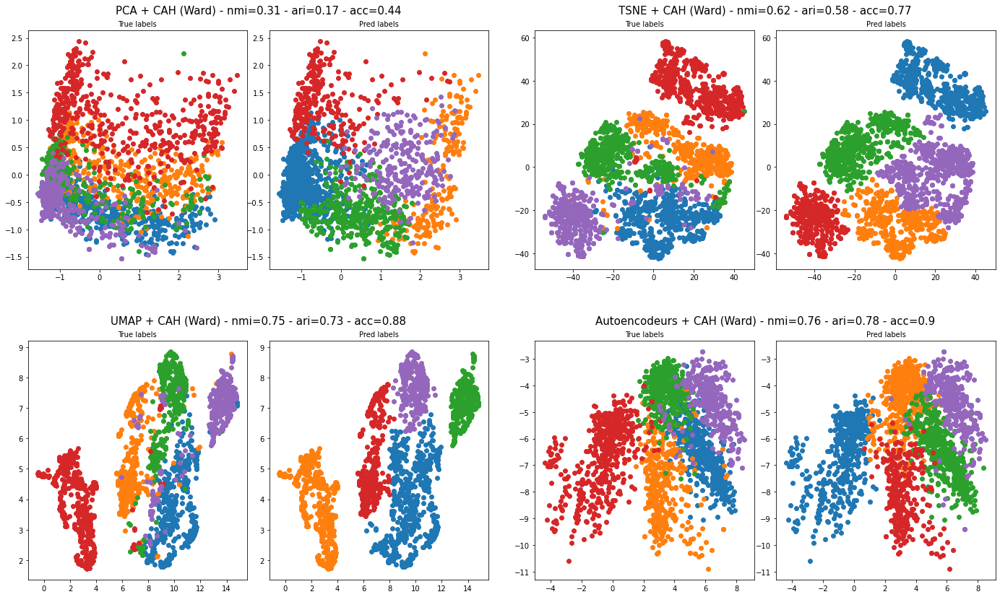

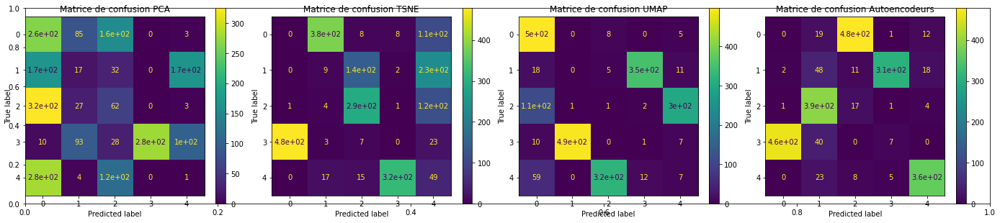

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

On a les meilleurs résultats avec l'UMAP et les autoencodeurs.

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:04<00:00, 11.85it/s]


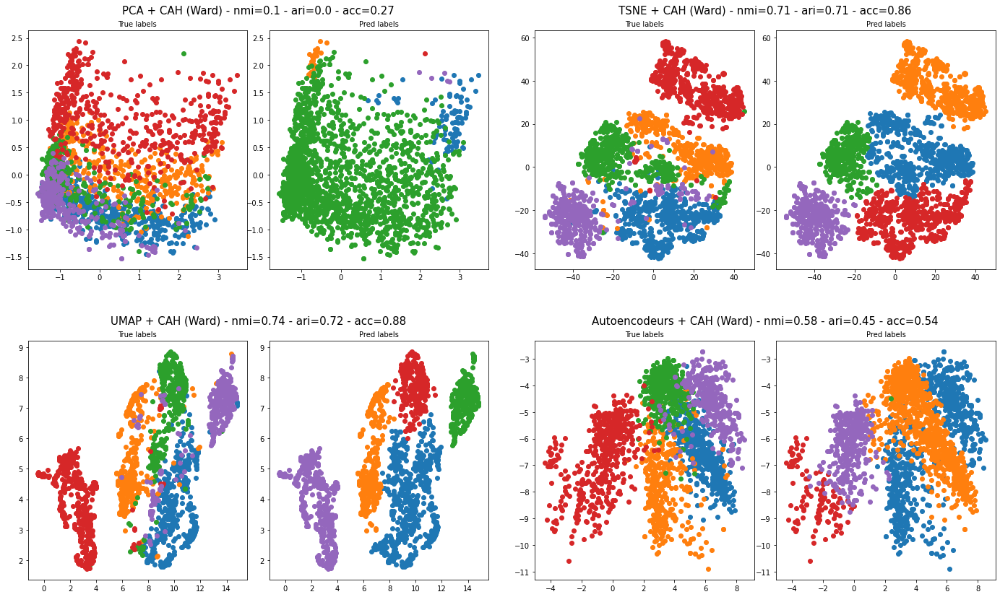

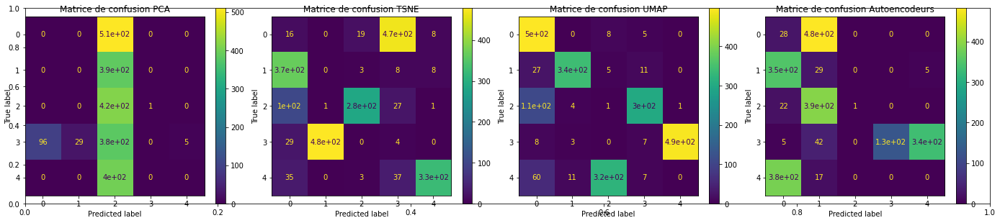

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

On a les meilleurs résultats avec l'UMAP et la TSNE

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.37  0.37  0.64  0.72          0.71
Spectral k-means                    0.6  0.52  0.58  0.56          0.68
HDBSCAN                            0.01  0.33  0.56  0.49          0.49
CAH + Ward                         0.35  0.31  0.62  0.75          0.76
CAH + distance moyenne              0.1   0.1  0.71  0.74          0.58 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.29  0.29  0.63  0.73          0.71
Spectral k-means                   0.53  0.43  0.44  0.45          0.54
HDBSCAN                              -0  0.06  0.38  0.26          0.22
CAH + Ward                          0.2  0.17  0.58  0.73          0.78
CAH + distance moyenne             0.04     0  0.71  0.72          0.45 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.

On constate que l'algorithme spectral k-means est meilleure sur l'espace de départ. 

La réduction de dimensions par PCA n'améliore pas les résultats.

Les performances de HDBSCAN sont les plus mauvais tandis que ceux de CAH avec distance moyenne sont les meilleurs. 

Les métriques affichent les meilleurs scores pour TSNE et UMAP. 


On peut conclure que TSNE et UMAP sont les méthodes à utiliser pour la réduction de dimensions pour la matrice BERT et RoBERTa.

# Partie 2 


## Matrice BERT

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_avg_bert.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = rkm[0]
list_pred_labels.append(pred_labels)
list_X.append(rkm[1][0])

acc_rkm = round(accuracy(labels, pred_labels), 2)
nmi_rkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm = round(adjusted_rand_score(labels, pred_labels), 2)



# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = fkm[0]
list_pred_labels.append(pred_labels)
list_X.append(fkm[1][0])

acc_fkm = round(accuracy(labels, pred_labels), 2)
nmi_fkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm = round(adjusted_rand_score(labels, pred_labels), 2)


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dcn = round(accuracy(labels, pred_labels), 2)
nmi_dcn = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn = round(adjusted_rand_score(labels, pred_labels), 2)

# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dkm = round(accuracy(labels, pred_labels), 2)
nmi_dkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm = round(adjusted_rand_score(labels, pred_labels), 2)

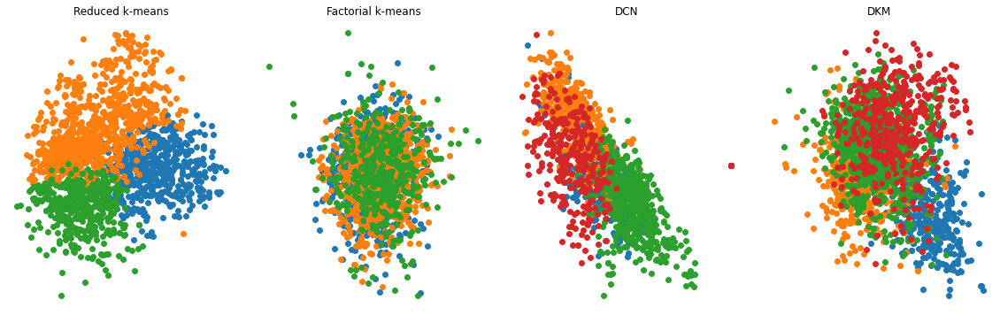

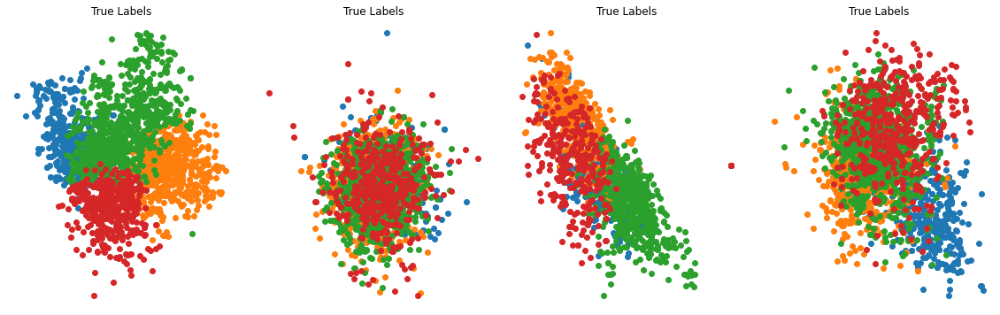

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.60,0.56,0.50,0.55
NMI,0.45,0.37,0.35,0.38
ARI,0.39,0.33,0.26,0.29


In [ ]:
affichage2D(list_X.copy(), list_pred_labels, list_titles)
affichage2D(list_X.copy(), [labels] * 4, ["True Labels"] * 4)

df_recap = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm, acc_fkm, acc_dcn, acc_dkm], 
                                  [nmi_rkm, nmi_fkm, nmi_dcn, nmi_dkm],
                                  [ari_rkm, ari_fkm, ari_dcn, ari_dkm],
                                  ])
df_recap

Les résultats obtenus sur la matrice bert sont moyens voire médiocres. Reduced k-means semble produire le meilleur résultat des 4 algorithmes aux travers des différentes métriques. 

## Matrice RoBERTa

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_avg_roberta.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = rkm[0]
list_pred_labels.append(pred_labels)
list_X.append(rkm[1][0])

acc_rkm = round(accuracy(labels, pred_labels), 2)
nmi_rkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm = round(adjusted_rand_score(labels, pred_labels), 2)



# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = fkm[0]
list_pred_labels.append(pred_labels)
list_X.append(fkm[1][0])

acc_fkm = round(accuracy(labels, pred_labels), 2)
nmi_fkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm = round(adjusted_rand_score(labels, pred_labels), 2)


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dcn = round(accuracy(labels, pred_labels), 2)
nmi_dcn = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn = round(adjusted_rand_score(labels, pred_labels), 2)

# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dkm = round(accuracy(labels, pred_labels), 2)
nmi_dkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm = round(adjusted_rand_score(labels, pred_labels), 2)

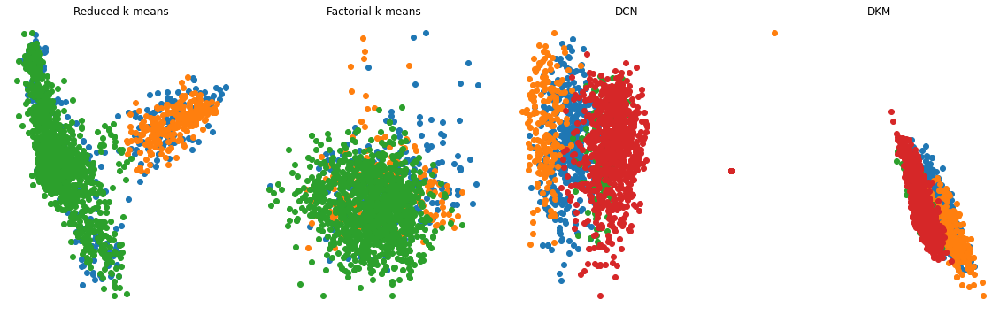

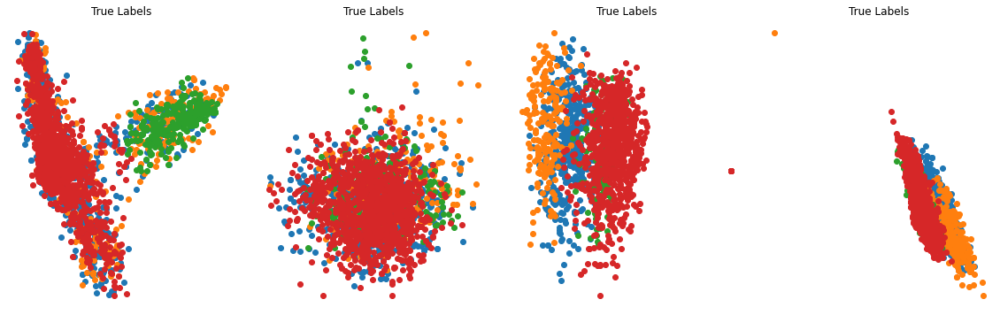

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.72,0.56,0.42,0.37
NMI,0.65,0.40,0.27,0.23
ARI,0.53,0.27,0.19,0.13


In [ ]:
affichage2D(list_X.copy(), list_pred_labels, list_titles)
affichage2D(list_X.copy(), [labels] * 4, ["True Labels"] * 4)

df_recap = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm, acc_fkm, acc_dcn, acc_dkm], 
                                  [nmi_rkm, nmi_fkm, nmi_dcn, nmi_dkm],
                                  [ari_rkm, ari_fkm, ari_dcn, ari_dkm],
                                  ])
df_recap

La matrice roberta nous donne globalement des meilleurs résultats que la matrice bert sur ce dataset bien qu'elle est nettement pire avec l'utilisation du deep k-means

Dans la partie 1, on trouve de bien meilleurs résultats que la partie 2 pour les 3 métriques.    

#<font color='red'> Analyse de la dataset ***classic4*** </font>

## Importation des données

In [ ]:
chemin = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/data/classic4.csv"
classic4 = pd.read_csv(chemin, index_col=0)
texts = classic4['text']
labels = classic4['label']

print(classic4)

nombre_de_classes = len(labels.value_counts())

labels = LabelEncoder().fit_transform(labels)

                                                   text label
0     Computer-Aided Analysis and Design of Informat...  cacm
1     Milestones in Cataloging In the case of the pr...  cisi
2     childhood psychosis. a description is given of...   med
3     neonatal hepatitis or familial neonatal obstru...   med
4     Handbook of Comparative Librarianship The firs...  cisi
...                                                 ...   ...
7090  throat and nose surgery in patients with const...   med
7091  Computers and Society: A Proposed Course for C...  cacm
7092                 Romberg Integration (Algorithm 60)  cacm
7093  Semantic Evaluation from Left to Right This pa...  cacm
7094       Toward Standards for Handwritten Zero and Oh  cacm

[7095 rows x 2 columns]


## Nettoyage des données

In [ ]:
texts = clean_abstracts(texts)

In [ ]:
def affichage(list_X, list_pred_labels, labels, list_titles):
  fig = plt.figure(figsize=(24,14))
  outer = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.3)

  ligne = 0
  
  for ligne_i in range(2):
    for i in range(2):
      # set outer titles
      ax = plt.Subplot(fig, outer[ligne_i, i])
      ax.set_title(list_titles[ligne], fontsize=15)
      ax.axis('off')
      fig.add_subplot(ax)

      inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[ligne_i, i], wspace=0.1, hspace=0.1)
      
      ax1 = plt.Subplot(fig, inner[0])
      for j in set(labels):
        ax1.scatter(list_X[ligne][labels==j, 0], list_X[ligne][labels==j, 1], label=str(j))
      ax1.set_title("True labels", fontsize=10)
      fig.add_subplot(ax1)

      ax2 = plt.Subplot(fig, inner[1])
      for j in set(list_pred_labels[ligne]):
        ax2.scatter(list_X[ligne][list_pred_labels[ligne]==j, 0], list_X[ligne][list_pred_labels[ligne]==j, 1], label=str(j))
      ax2.set_title("Pred labels", fontsize=10)
      fig.add_subplot(ax2)

      ligne = ligne + 1
  fig.show()

  # Affichage des matrices de confusion
  fig_confusion_matrix = plt.figure(figsize=(24,5))
  outer_cm = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

  for i in range(4):
    axe = plt.Subplot(fig_confusion_matrix, outer_cm[i])
    cm_plot = ConfusionMatrixDisplay(confusion_matrix(labels, list_pred_labels[i]), display_labels=set(labels)).plot(ax=axe)
    cm_plot.ax_.set_title(f"Matrice de confusion {list_X_titles[i]}")
    fig_confusion_matrix.add_subplot(axe)
    
  fig_confusion_matrix.show()


# comparaison entre les vrais labels et des labels prédits
def eval_clustering_2D(X_reduced, labels_pred, labels_true):

  print('\nAccuracy : ', round(accuracy(labels_true, labels_pred), 2))
  print('NMI : ', round(normalized_mutual_info_score(labels_true, labels_pred), 2))
  print('ARI : ', round(adjusted_rand_score(labels_true, labels_pred), 2))

  color = ['red', 'blue', 'green', 'yellow', 'purple', 'brown', 'pink', 'gray', 'black']

  fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey='row')

  for i in set(labels_pred.tolist()):
    axes[0].scatter(X_reduced[labels_pred == i, 0], X_reduced[labels_pred == i, 1], s = 50, c = color[i], label = 'Cluster ' + str(i))
  axes[0].set_title("predicted labels")
  axes[0].legend()

  for i in set(labels_true.tolist()):
    axes[1].scatter(X_reduced[labels_true == i, 0], X_reduced[labels_true == i, 1], s = 50, c = color[i], label = 'Cluster ' + str(i))
  axes[1].set_title("true labels")
  axes[1].legend()

  plt.show()

  print()

  fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey='row')

  cf_matrix = confusion_matrix(labels_true, labels_pred)
  disp = ConfusionMatrixDisplay(cf_matrix, display_labels=set(labels_true))
  disp.plot(ax=axes[0])
  disp.ax_.set_title("Confusion matrix, without normalization")

  cf_matrix2 = confusion_matrix(labels_true, labels_pred, normalize='all')
  disp2 = ConfusionMatrixDisplay(cf_matrix2, display_labels=set(labels_true))
  disp2.plot(ax=axes[1])
  disp2.ax_.set_title("Normalized confusion matrix")

  plt.subplots_adjust(wspace=0.40, hspace=0.1)

  plt.show()

## Embeddings

#### BERT

In [ ]:
def compute_average_embeddings(matrices):
  matrices = np.swapaxes(matrices, 0, 1)
  word_vectors = [matrix.mean(axis=0) for matrix in matrices]
  avg_matrix = np.vstack(word_vectors)
  return avg_matrix

def compute_concat_embeddings(matrices):
  return np.hstack(matrices)

In [ ]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

In [ ]:
model_name = "bert-base-cased"
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained(model_name)

if device == "cuda":
    model.cuda()

bert_embeddings = utils.encode_sentences_batch(model, tokenizer, texts, batch_size=32)

x_concat_bert = compute_concat_embeddings(bert_embeddings)
x_avg_bert = compute_average_embeddings(bert_embeddings)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
print("Dimensions de la matrice x_concat_bert : ", x_concat_bert.shape)
print("Dimensions de la matrice x_avg_bert : ", x_avg_bert.shape)

Dimensions de la matrice x_concat_bert :  (7095, 9216)
Dimensions de la matrice x_avg_bert :  (7095, 768)


#### RoBERTa

In [ ]:
model_name = "roberta-base"
model = RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = RobertaTokenizer.from_pretrained(model_name)

if device == "cuda":
    model.cuda()
    
roberta_embeddings = utils.encode_sentences_batch(model, tokenizer, classic4['text'], batch_size=32)

x_concat_roberta = compute_concat_embeddings(roberta_embeddings)
x_avg_roberta = compute_average_embeddings(roberta_embeddings)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
print("Dimensions de la matrice x_concat_roberta : ", x_concat_roberta.shape)
print("Dimensions de la matrice x_avg_roberta : ", x_avg_roberta.shape)

Dimensions de la matrice x_concat_roberta :  (7095, 9216)
Dimensions de la matrice x_avg_roberta :  (7095, 768)


# Partie 1

## Matrice BERT

### Méthodes de réduction de dimensions



Nombre composantes considéré pour x_avg_bert : 68
Nombre composantes considéré pour x_avg_roberta : 21



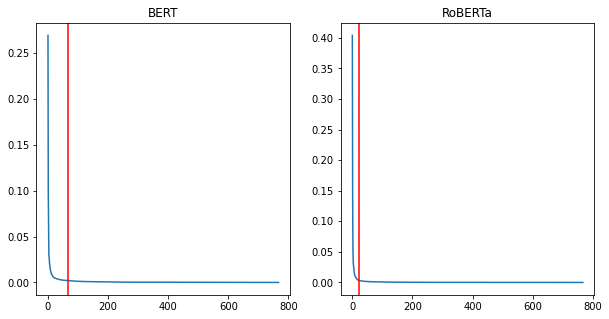

In [ ]:
fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(1, 2)

X = [x_avg_bert, x_avg_roberta]
X_label = ["BERT", "RoBERTa"]
n_composantes_pca = []

for j in range(2):
  pca = PCA()
  X_reduced_pca = pca.fit_transform(X[j])
  y = pca.explained_variance_ratio_

  n_composantes_pca.append(np.where(np.cumsum(y) > 0.80)[0][0])

  x_composantes = np.arange(X[j].shape[1])

  axes[j].plot(x_composantes, y)
  axes[j].set_title(X_label[j])
  axes[j].axvline(n_composantes_pca[j], color="red", label=f"Composante {n_composantes_pca[j]}")

fig.show()

print(f"Nombre composantes considéré pour x_avg_bert : {n_composantes_pca[0]}\nNombre composantes considéré pour x_avg_roberta : {n_composantes_pca[1]}\n")

100%|██████████| 200/200 [00:44<00:00,  4.51it/s]


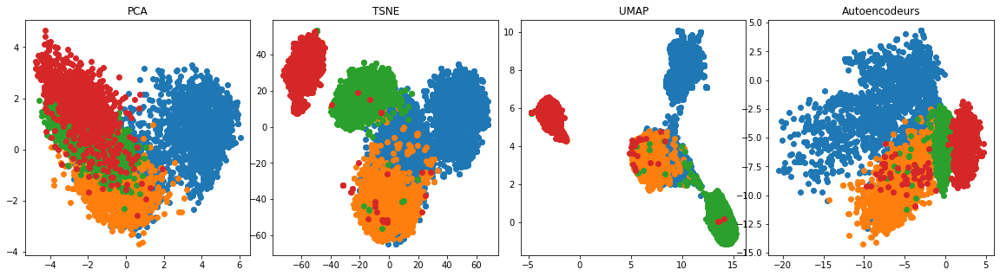

In [ ]:
X = x_avg_bert

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

Parmi les 4 méthodes de réduction de dimensions, on constate que la méthode UMAP sépare le mieux les 4 clusters, bien que les individus d'un cluster se superposent avec ceux d'un autre. 

### Clustering par k-means




100%|██████████| 50/50 [00:11<00:00,  4.51it/s]


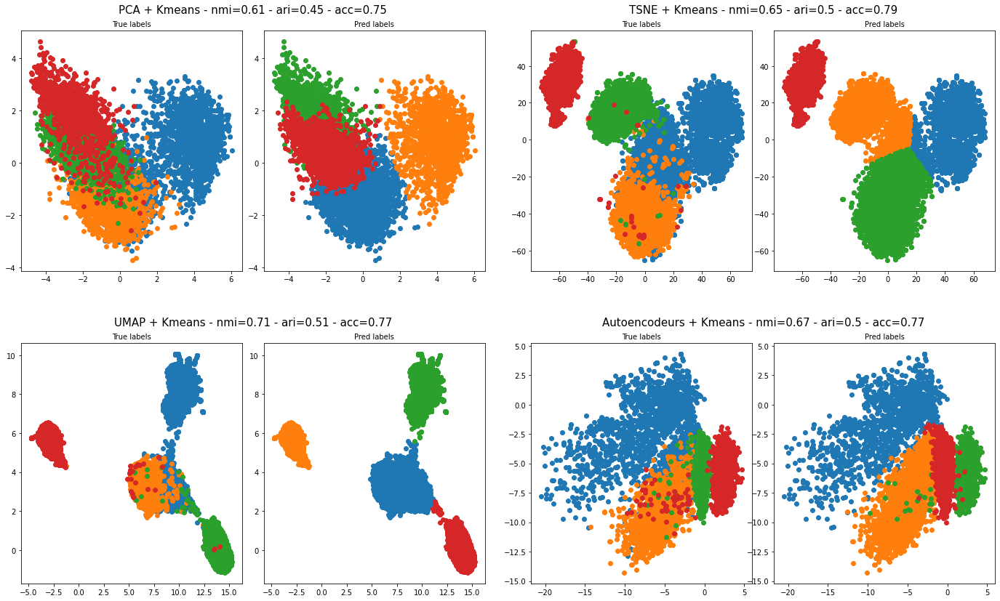

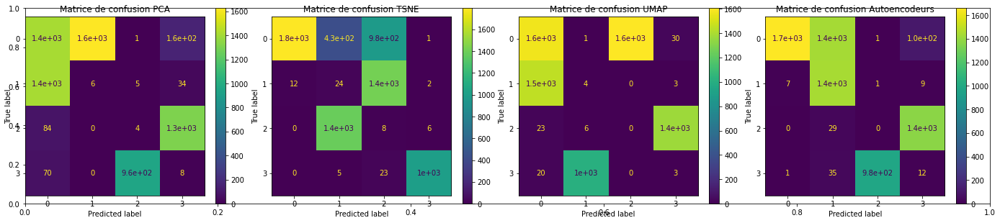

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
  nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
  ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

L'algorithme k-means arrive assez bien à bien classifier les points. C'est en réduisant les dimensions avec la méthode UMAP qu'on a les meilleurs résultats.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


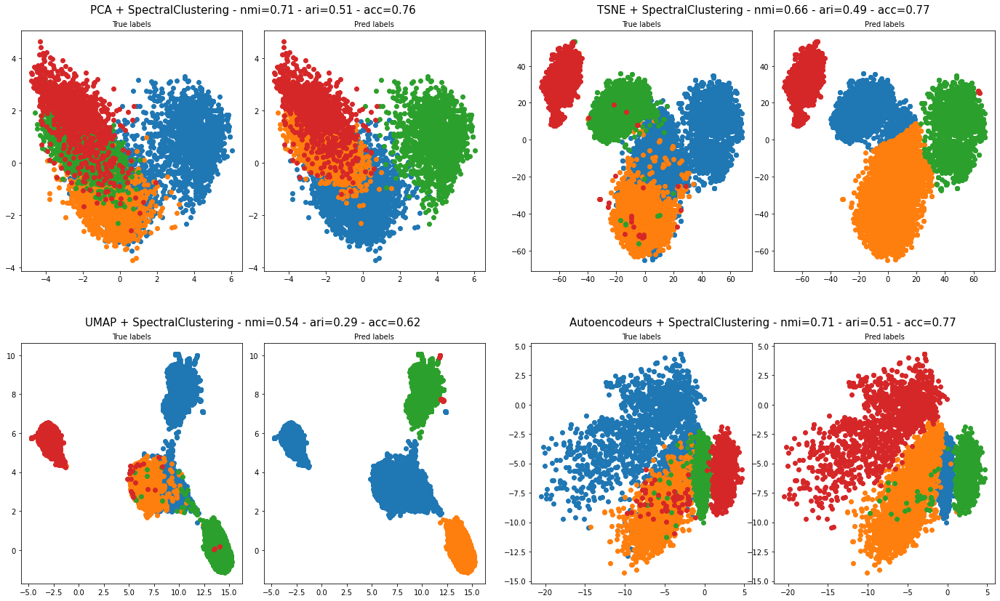

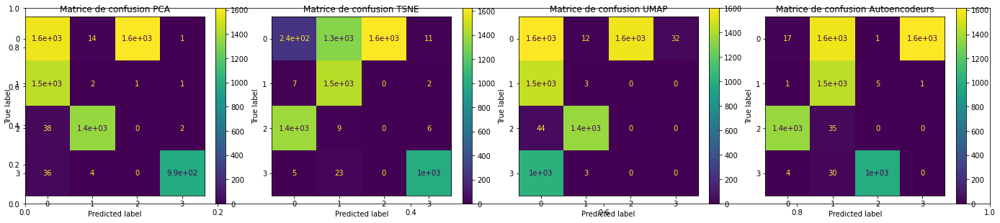

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Avec le spectral k-means, on s'aperçoit que la réduction de dimensions avec UMAP affiche les plus mauvais résultats.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:11<00:00,  4.51it/s]


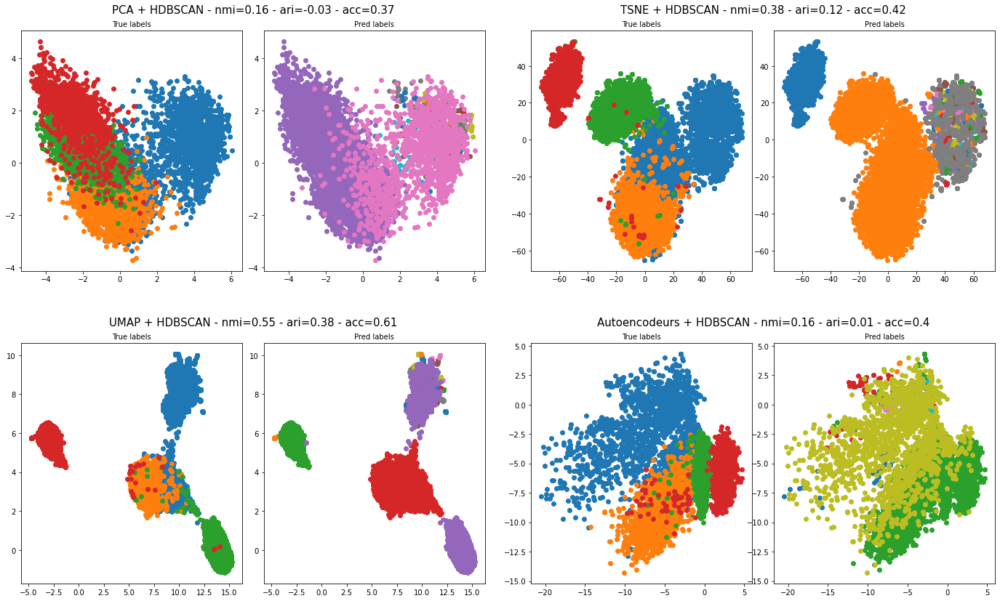

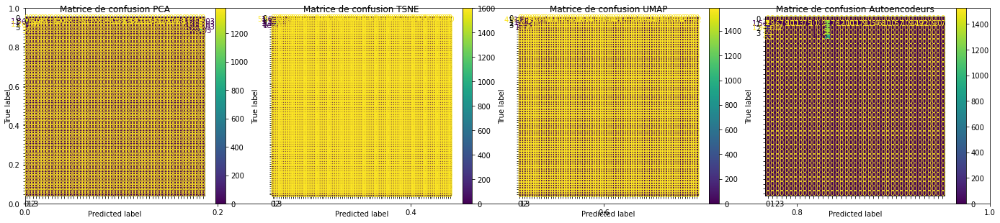

In [ ]:
X = x_avg_bert

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Quelque soit la méthode de réduction de dimensions, le clustering avec HDBSCAN a de très mauvais résultats. 

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:11<00:00,  4.48it/s]


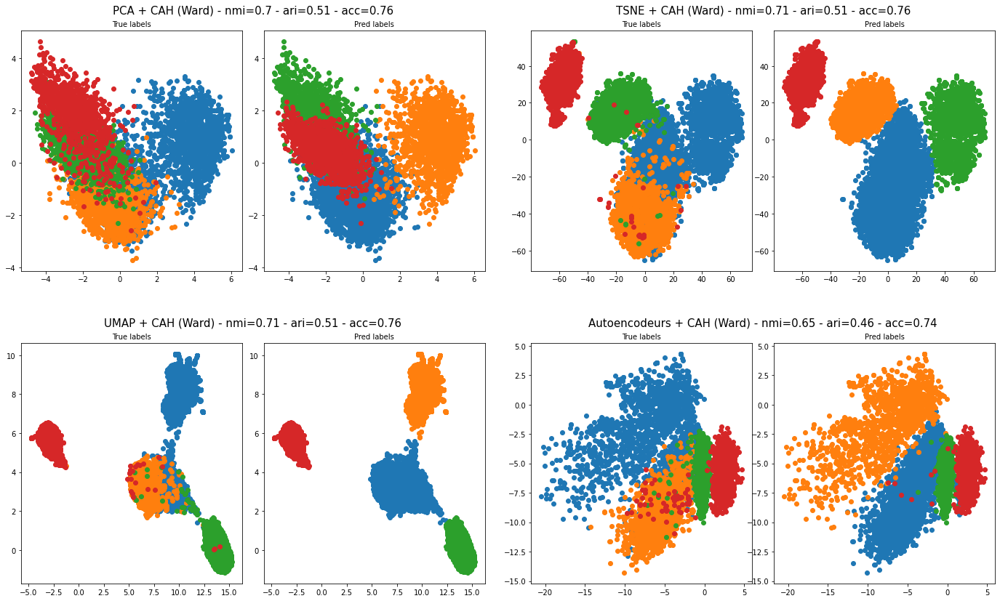

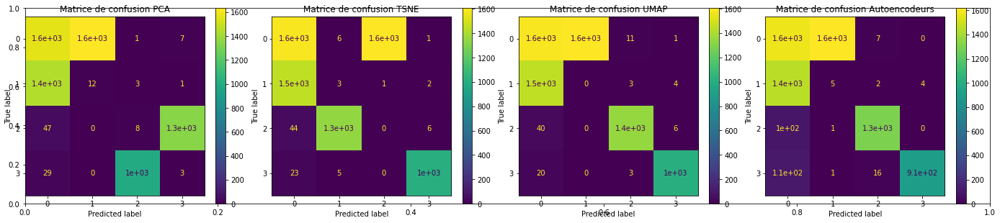

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme CAH avec ward, les performances sont similaires quelque soit la méthode de réduction de dimensions. 

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:11<00:00,  4.43it/s]


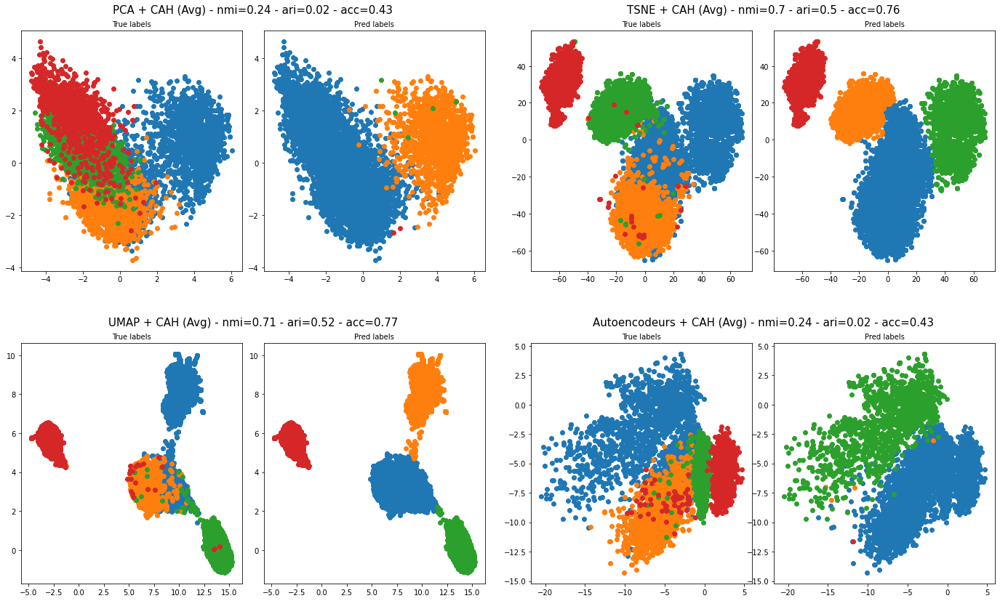

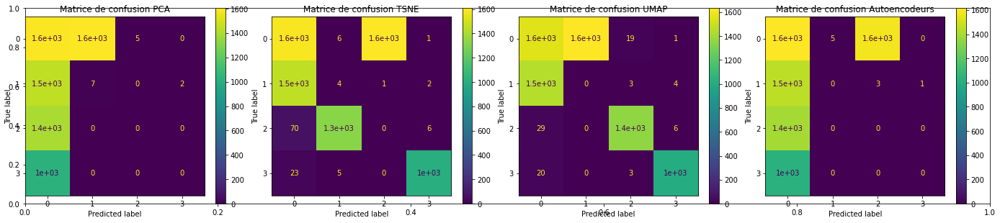

In [ ]:
k = nombre_de_classes
X = x_avg_bert

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Avg) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme CAH avec distance moyenne, les performances sont similaires pour UMAP et TSNE.  

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.62  0.61  0.65  0.71          0.67
Spectral k-means                    0.7  0.71  0.66  0.54          0.71
HDBSCAN                            0.16  0.16  0.38  0.55          0.16
CAH + Ward                         0.68   0.7  0.71  0.71          0.65
CAH + distance moyenne                0  0.24   0.7  0.71          0.24 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.45  0.45   0.5  0.51           0.5
Spectral k-means                    0.5  0.51  0.49  0.29          0.51
HDBSCAN                           -0.03 -0.03  0.12  0.38          0.01
CAH + Ward                         0.49  0.51  0.51  0.51          0.46
CAH + distance moyenne               -0  0.02   0.5  0.52          0.02 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.

On remarque que les scores en NMI sont plus élévés que ceux de l'ARI. 
Les performances de l'algorithme HDBSCAN sont généralement mauvais avec et sans réduction de dimensions. 
La CAH avec la distance moyenne a des résultats qui dépendent fortement de la méthode de réduction (bon avec TSNE et UMAP, mauvais avec PCA et auto-encodeur)
Les meilleurs résultats sont produits par les algorithmes k-means et CAH avec Ward. Cependant, on remarque qu'en les appliquant directement sur l'espace de départ, on aurait eu des résultats assez similaires. 
L'application de l'algorithme de spectral k-means sur l'espace de départ est meilleure qu'après réduction de dimensions.

On peut conclure que les méthodes de réduction de dimensions ne sont pas très concluants sur la matrice Bert. 

## Matrice RoBERTa

### Méthodes de réduction de dimensions


100%|██████████| 200/200 [00:44<00:00,  4.50it/s]


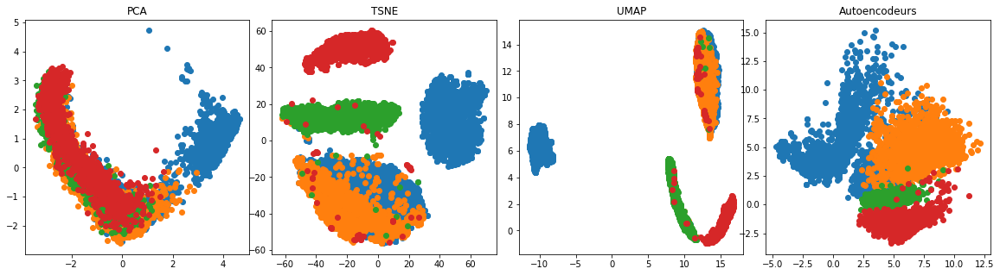

In [ ]:
X = x_avg_roberta

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

Aucune des 4 méthodes ne parvient à bien séparer les 4 clusters. Toutefois, c'est la méthode TSNE qui en ait le plus proche, bien que 2 clusters se superposent.

### Clustering par k-means


100%|██████████| 50/50 [00:11<00:00,  4.54it/s]


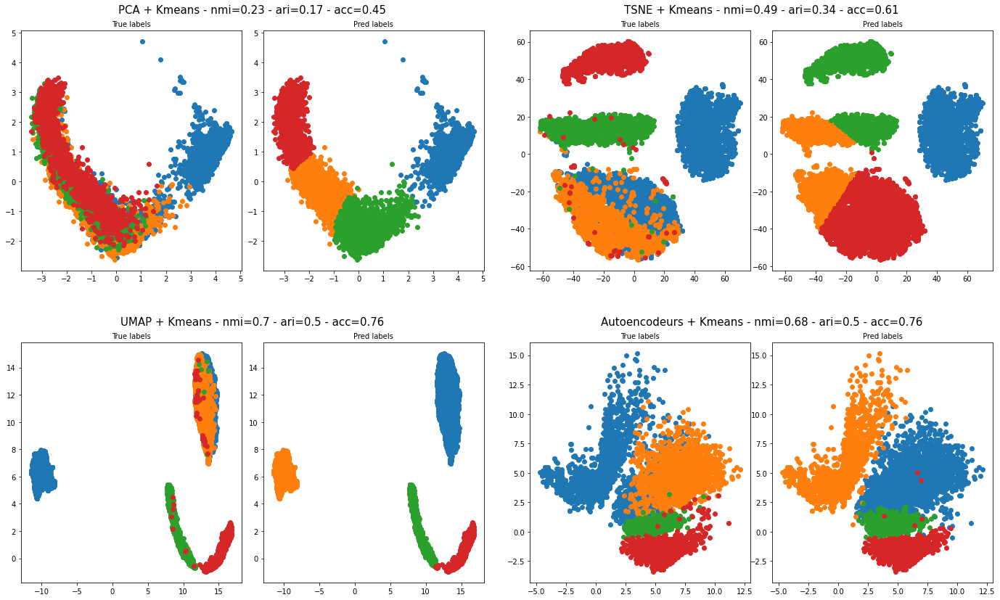

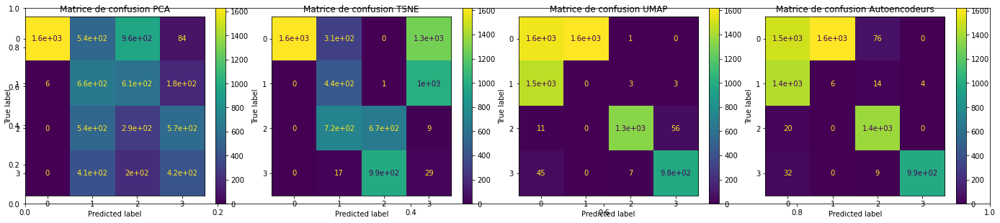

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme k-means, on obtient des résultats corrects avce l'UMAP et les autoencodeurs. 

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


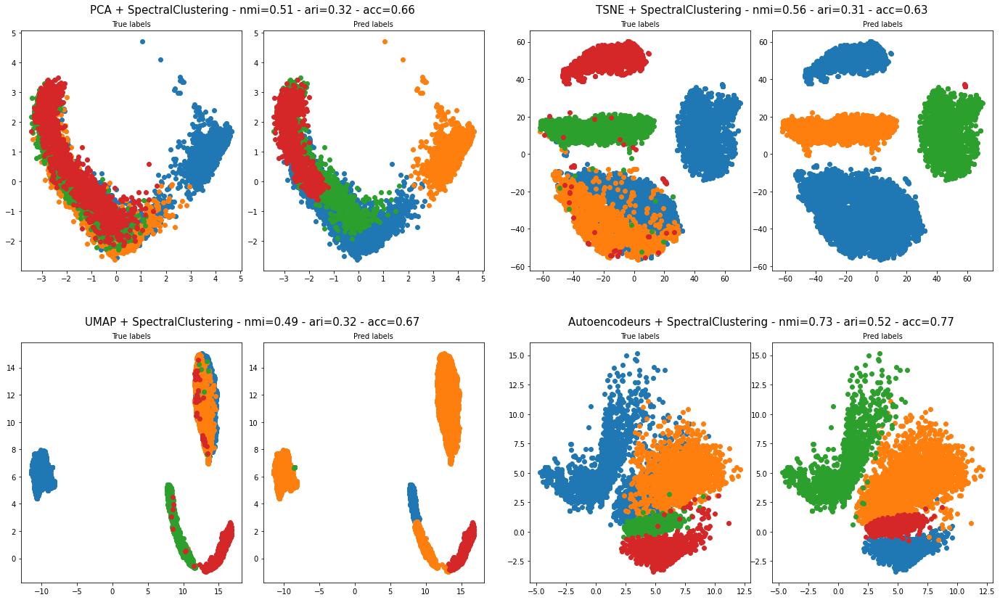

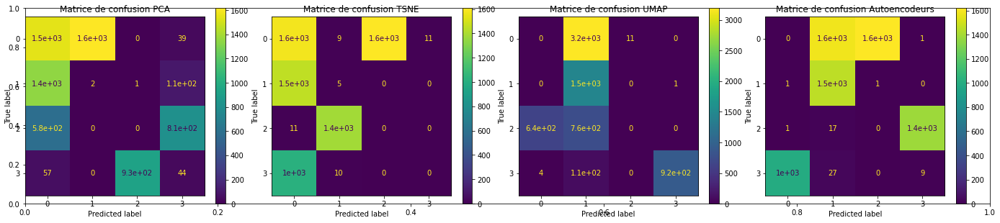

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme spectral k-means, seulement la méthode autoencodeur a des résultats corrects (>50%) pour le NMI et l'ARI.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:10<00:00,  4.56it/s]


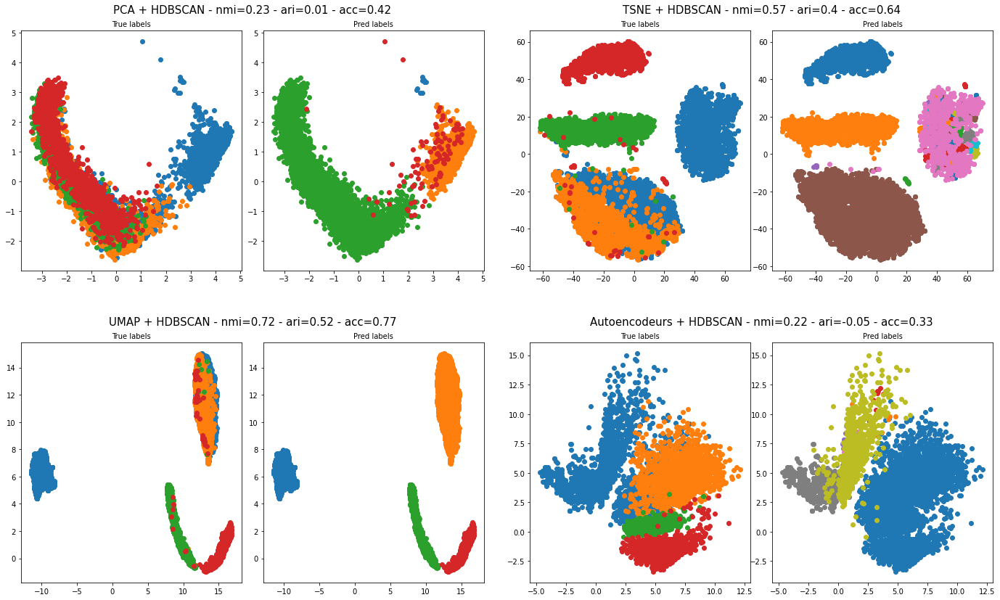

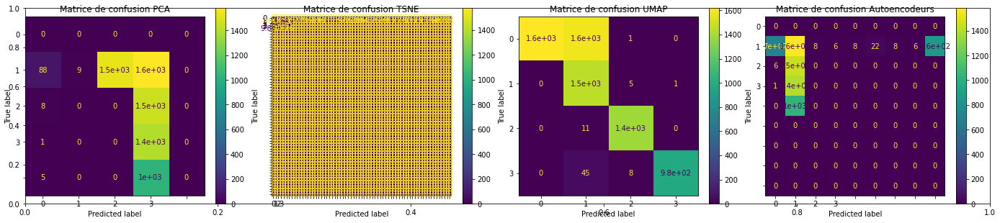

In [ ]:
X = x_avg_roberta

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme HDBCAN, on a les meilleurs résultats avce la méthode UMAP.

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:11<00:00,  4.47it/s]


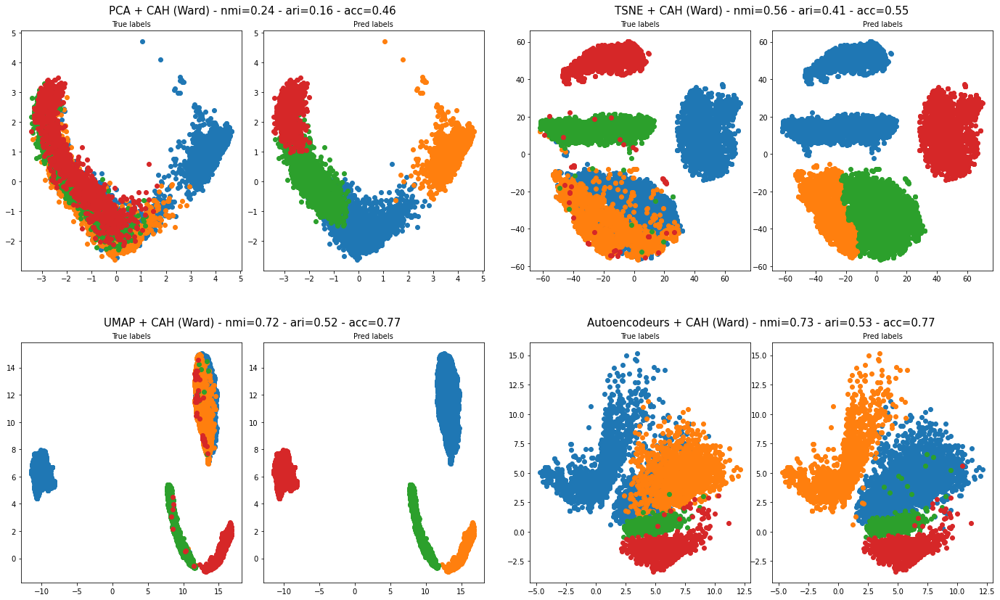

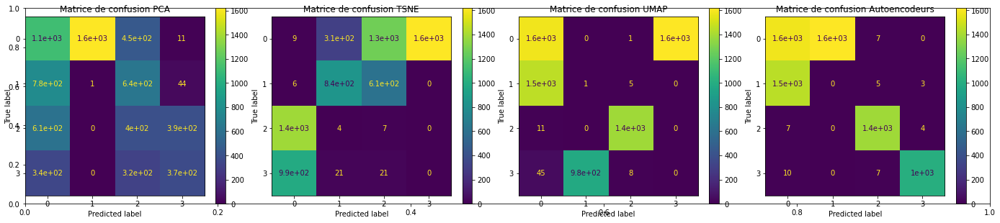

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme CAH avec avec Ward, on a les meilleurs résultats avec UMAP et les autoencodeurs.

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:12<00:00,  4.14it/s]


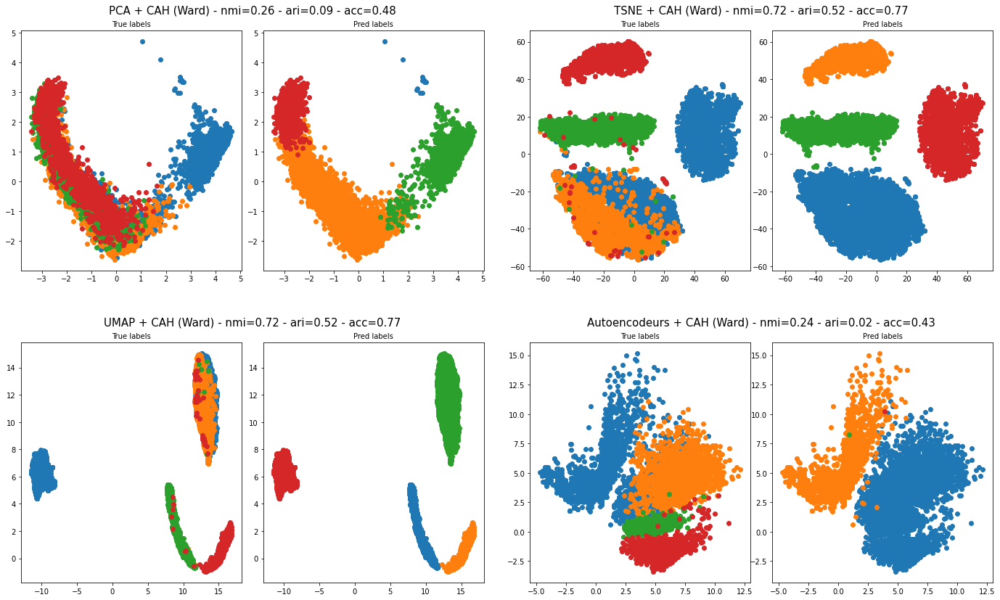

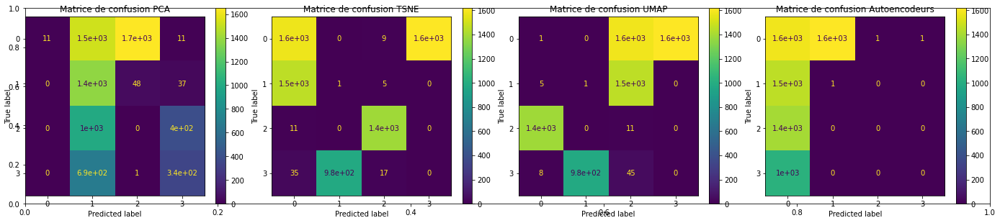

In [ ]:
k = nombre_de_classes
X = x_avg_roberta

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Pour l'algorithme CAH avec distance moyenne, on a les meilleurs résultats avec les réductions de diemsnions réalisés par TSNE et UMAP.

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.23  0.23  0.49   0.7          0.68
Spectral k-means                   0.58  0.51  0.56  0.49          0.73
HDBSCAN                             0.2  0.23  0.57  0.72          0.22
CAH + Ward                         0.27  0.24  0.56  0.72          0.73
CAH + distance moyenne             0.24  0.26  0.72  0.72          0.24 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.17  0.17  0.34   0.5           0.5
Spectral k-means                   0.39  0.32  0.31  0.32          0.52
HDBSCAN                           -0.02  0.01   0.4  0.52         -0.05
CAH + Ward                         0.19  0.16  0.41  0.52          0.53
CAH + distance moyenne             0.02  0.09  0.52  0.52          0.02 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.

La réduction de dimension réalisée par UMAP a toujours les  meilleurs scores parmi les 4 méthodes de réductio tandis que PCA a les pires scores. 
L'algorithme spectral k-means a de meilleurs performances sur l'espace de départ qu'après la réduction. 

On peut conclure que les méthodes de réduction de dimensions sont généralament intéressants pour la matrice de RoBERTa.

Alors que pour la matrice BERT, les résultats ne sont pas meilleurs après avoir réaliser une réduction de dimensions.

# Partie 2

## Matrice BERT

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_avg_bert.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = rkm[0]
list_pred_labels.append(pred_labels)
list_X.append(rkm[1][0])

acc_rkm = round(accuracy(labels, pred_labels), 2)
nmi_rkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm = round(adjusted_rand_score(labels, pred_labels), 2)



# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = fkm[0]
list_pred_labels.append(pred_labels)
list_X.append(fkm[1][0])

acc_fkm = round(accuracy(labels, pred_labels), 2)
nmi_fkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm = round(adjusted_rand_score(labels, pred_labels), 2)


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dcn = round(accuracy(labels, pred_labels), 2)
nmi_dcn = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn = round(adjusted_rand_score(labels, pred_labels), 2)

# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dkm = round(accuracy(labels, pred_labels), 2)
nmi_dkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm = round(adjusted_rand_score(labels, pred_labels), 2)

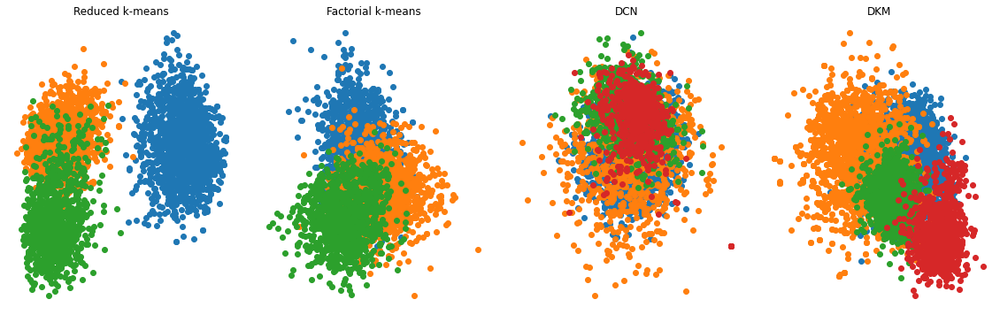

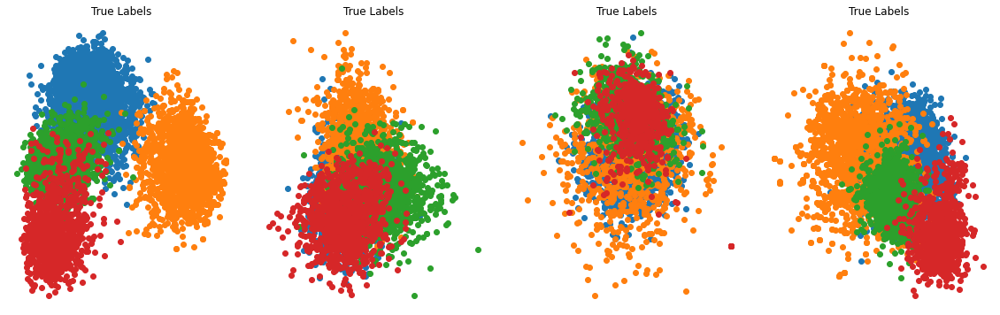

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.76,0.75,0.77,0.77
NMI,0.66,0.60,0.66,0.71
ARI,0.48,0.46,0.49,0.51


In [ ]:
affichage2D(list_X.copy(), list_pred_labels, list_titles)
affichage2D(list_X.copy(), [labels] * 4, ["True Labels"] * 4)

df_recap = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm, acc_fkm, acc_dcn, acc_dkm], 
                                  [nmi_rkm, nmi_fkm, nmi_dcn, nmi_dkm],
                                  [ari_rkm, ari_fkm, ari_dcn, ari_dkm],
                                  ])
df_recap

Nous remarquons ici que les 4 algorithmes nous donnent des résultats très similaires. Le deep k-means l'emporte tout de même en produisant les meilleurs métriques au travers des trois calculées.

## Matrice RoBERTa

In [ ]:
list_X = []
list_pred_labels = []
list_titles = ["Reduced k-means", "Factorial k-means", "DCN", "DKM"]

n_components = 15
X = x_avg_roberta.copy()


# ----- Reduced K-means -----
import tensorflow.compat.v1 as tf

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = rkm[0]
list_pred_labels.append(pred_labels)
list_X.append(rkm[1][0])

acc_rkm = round(accuracy(labels, pred_labels), 2)
nmi_rkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm = round(adjusted_rand_score(labels, pred_labels), 2)



# ----- Factorial K-means -----
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)

pred_labels = fkm[0]
list_pred_labels.append(pred_labels)
list_X.append(fkm[1][0])

acc_fkm = round(accuracy(labels, pred_labels), 2)
nmi_fkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm = round(adjusted_rand_score(labels, pred_labels), 2)


# ----- DCN -----
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dcn = round(accuracy(labels, pred_labels), 2)
nmi_dcn = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn = round(adjusted_rand_score(labels, pred_labels), 2)

# ----- DKM -----
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

list_pred_labels.append(pred_labels)
list_X.append(X_reduced)

acc_dkm = round(accuracy(labels, pred_labels), 2)
nmi_dkm = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm = round(adjusted_rand_score(labels, pred_labels), 2)

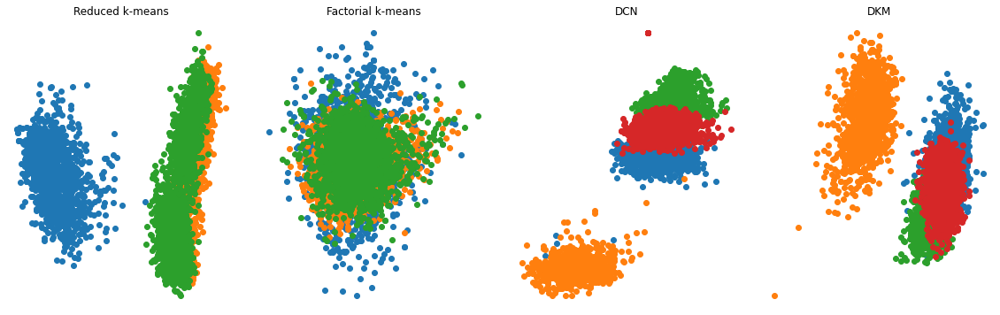

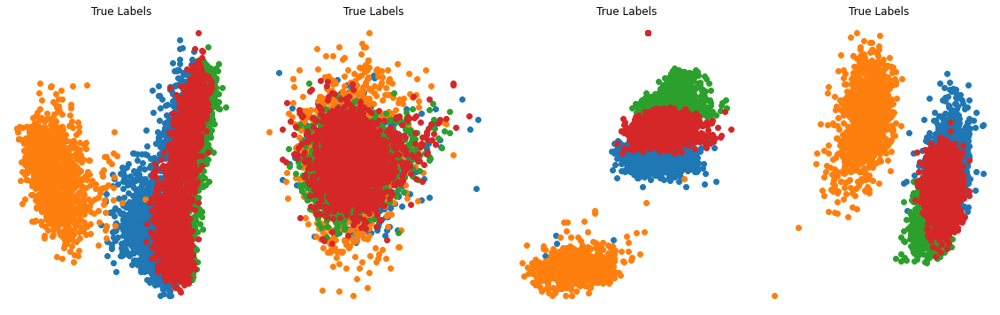

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.76,0.74,0.45,0.44
NMI,0.65,0.57,0.23,0.21
ARI,0.48,0.42,0.17,0.16


In [ ]:
affichage2D(list_X.copy(), list_pred_labels, list_titles)
affichage2D(list_X.copy(), [labels] * 4, ["True Labels"] * 4)

df_recap = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm, acc_fkm, acc_dcn, acc_dkm], 
                                  [nmi_rkm, nmi_fkm, nmi_dcn, nmi_dkm],
                                  [ari_rkm, ari_fkm, ari_dcn, ari_dkm],
                                  ])
df_recap

Bien que les classes semblent être bien definies sur le deep clustering network, ce dernier produit des résultats très insatisfaisant. Tandis que le reduced k-means et le factorial k-means nous donnent des bien meilleurs réultats. <br>
Globalement comparé à la matrice bert, la matrice roberta donne des plus mauvais résultats.

Dans la partie 1, on trouve les meilleurs résultats après la réduction de dimensions réalisée par UMAP. Ces scores sont similaires à ceux de Deep k-means sur la matrice BERT, les meilleurs résultats de la partie 2.   